### Домашнє завдання: Кластеризація в Аналізі Персоналій Клієнтів

#### Контекст
В цьому ДЗ ми скористаємось алгоритмами кластеризації для задачі аналізу портретів клієнтів (Customer Personality Analysis).

Customer Personality Analysis - це аналіз різних сегментів клієнтів компанії. Цей аналіз дозволяє бізнесу краще розуміти своїх клієнтів і полегшує процес адаптації продуктів під конкретні потреби, поведінку та інтереси різних типів клієнтів.

Аналіз портретів клієнтів допомагає бізнесу змінювати свій продукт на основі цільової аудиторії, розділеної на різні сегменти. Наприклад, замість того, щоб витрачати гроші на маркетинг нового продукту для всіх клієнтів у базі даних компанії, бізнес може проаналізувати, який сегмент клієнтів найімовірніше придбає продукт, і потім зосередити маркетингові зусилля лише на цьому сегменті.

#### Завдання
На основі наданих даних в файлі `marketing_campaign.csv` потрібно виконати кластеризацію, щоб виявити сегменти клієнтів.

#### Вхідні дані
Вам надано набір даних з такими атрибутами:

**Характеристики користувачів:**
- `ID`: Унікальний ідентифікатор клієнта
- `Year_Birth`: Рік народження клієнта
- `Education`: Рівень освіти клієнта
- `Marital_Status`: Сімейний стан клієнта
- `Income`: Річний дохід домогосподарства клієнта
- `Kidhome`: Кількість дітей у домогосподарстві клієнта
- `Teenhome`: Кількість підлітків у домогосподарстві клієнта
- `Dt_Customer`: Дата реєстрації клієнта у компанії
- `Recency`: Кількість днів з моменту останньої покупки клієнта
- `Complain`: 1, якщо клієнт скаржився за останні 2 роки, 0 - якщо ні

**Продукти:**
- `MntWines`: Сума, витрачена на вино за останні 2 роки
- `MntFruits`: Сума, витрачена на фрукти за останні 2 роки
- `MntMeatProducts`: Сума, витрачена на м'ясні продукти за останні 2 роки
- `MntFishProducts`: Сума, витрачена на рибні продукти за останні 2 роки
- `MntSweetProducts`: Сума, витрачена на солодощі за останні 2 роки
- `MntGoldProds`: Сума, витрачена на золото за останні 2 роки

**Акції:**
- `NumDealsPurchases`: Кількість покупок, зроблених з використанням знижок
- `AcceptedCmp1`: 1, якщо клієнт прийняв пропозицію у першій кампанії, 0 - якщо ні
- `AcceptedCmp2`: 1, якщо клієнт прийняв пропозицію у другій кампанії, 0 - якщо ні
- `AcceptedCmp3`: 1, якщо клієнт прийняв пропозицію у третій кампанії, 0 - якщо ні
- `AcceptedCmp4`: 1, якщо клієнт прийняв пропозицію у четвертій кампанії, 0 - якщо ні
- `AcceptedCmp5`: 1, якщо клієнт прийняв пропозицію у п'ятій кампанії, 0 - якщо ні
- `Response`: 1, якщо клієнт прийняв пропозицію в останній кампанії, 0 - якщо ні

**Взаємодія з компанією:**
- `NumWebPurchases`: Кількість покупок, зроблених через вебсайт компанії
- `NumCatalogPurchases`: Кількість покупок, зроблених за каталогом
- `NumStorePurchases`: Кількість покупок, зроблених безпосередньо у магазинах
- `NumWebVisitsMonth`: Кількість відвідувань вебсайту компанії за останній місяць


In [109]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import DBSCAN
from sklearn import metrics

In [2]:
pd.set_option('display.max_columns', None)

## Завдання 1

**Завдання 1**. Завантажте дані з `marketing_campaign.csv` в Pandas dataframe і виведіть основну інформацію про дані: скільки всього рядків і колонок, які типи даних мають колонки, скільки пропущених значень.

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
df = pd.read_csv('/content/drive/MyDrive/ML DS/Module 3/Data/marketing_campaign.csv', sep='\t')

In [5]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [7]:
df[df.select_dtypes(include=np.number).columns.tolist()].isna().sum()

,0
ID,0
Year_Birth,0
Income,24
Kidhome,0
Teenhome,0
Recency,0
MntWines,0
MntFruits,0
MntMeatProducts,0
MntFishProducts,0


In [8]:
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
print(numerical_cols)

['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response']


In [9]:
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')

In [10]:
categorical_cols = df.select_dtypes('object').columns.tolist()
print(categorical_cols)

['Education', 'Marital_Status']


- Датасет містить 29 стовпців та 2240 записів;
- Пропущені значення у колонці Income
- Кількість стовпців за типом даних:
  - Категоріальні: 2
  - Дата: 1
  - Числові: 26

## Завдання 2

**Завдання 2.** Заповніть пропущені значення з врахуванням того завдання (кластеризація), яке ми виконуємо. Поясніть свій вибір заповнення пропущених значень.

Відсутність запису в Income може бути сигналом, тому пропущені значення можна заповнити значенням -1, що означатиме категорію з відсутнім записом про дохід, і також додати колонку, яка буде індикатором відсутності доходу

In [11]:
df['Income_missing'] = df['Income'].isna().astype(int)
df['Income'] = df['Income'].fillna(-1)

In [12]:
df[df.select_dtypes(include=np.number).columns.tolist()].isna().sum()

,0
ID,0
Year_Birth,0
Income,0
Kidhome,0
Teenhome,0
Recency,0
MntWines,0
MntFruits,0
MntMeatProducts,0
MntFishProducts,0


## Завдання 3

**Завдання 3.** У нас є декілька колонок з категоріальними значеннями та одна колонка з датою. Як би ви обробили ці колонки для того, аби передати їх в алгоритм кластеризації?

Реалізуйте обробку категоріальних колонок і колонки з датою та перетворіть їх на ознаки, корисні для кластеризації з вашого погляду.

### Dt_Customer

Колонку з датою напряму не можна передавати в модель. Натомість з цієї колонки отримаємо "вік" клієнта відносно максимальної дати в датасеті. Таким чином утвориться числова колонка, а оригінальну колонку з датою не буде передано в модель

In [13]:
max_date = df['Dt_Customer'].max()
print(max_date)

2014-06-29 00:00:00


In [14]:
df['lifetime_days'] = (max_date - df['Dt_Customer']).dt.days

In [15]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,0,663
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,0,113
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,0,312
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,0,139
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,0,161


### Категоріальні колонки

Для категоріальних колонок підберемо спосіб кодування з огляду на кількість унікальних значень

#### Education

In [16]:
df['Education'].value_counts()

,count
Education,
Graduation,1127
PhD,486
Master,370
2n Cycle,203
Basic,54


Для колонки Education можна використати one-hot encoding

#### Marital_Status

In [17]:
df['Marital_Status'].value_counts()

,count
Marital_Status,
Married,864
Together,580
Single,480
Divorced,232
Widow,77
Alone,3
Absurd,2
YOLO,2


Для колонки Marital_Status бачимо кілька значень, які логічно виглядають як неправильно введені статуси ('Absurd', 'YOLO'). Такого типу записи можуть спричинити помилки класифікації. Також деякі статуси дублюються між собою за логікою, тому їх також можна об'єднати

In [18]:
map = {
    'Alone': 'Single',
    'Absurd': 'Else',
    'YOLO': 'Else'
}

In [19]:
df['clean_Marital_Status'] = df['Marital_Status'].replace(map)

Після такої обробки до колонки можна також застосувати one-hot encoding

#### One-hot Encoding

In [20]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,clean_Marital_Status
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,0,663,Single
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,0,113,Single
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,0,312,Together
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,0,139,Together
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,0,161,Married
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,0,381,Married
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,0,19,Together
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,0,155,Divorced
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,0,156,Together


In [21]:
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

In [22]:
categorical_cols = ['Education', 'clean_Marital_Status']
encoder.fit(df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [23]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Education_2n Cycle', 'Education_Basic', 'Education_Graduation', 'Education_Master', 'Education_PhD', 'clean_Marital_Status_Divorced', 'clean_Marital_Status_Else', 'clean_Marital_Status_Married', 'clean_Marital_Status_Single', 'clean_Marital_Status_Together', 'clean_Marital_Status_Widow']


In [24]:
df[encoded_cols] = encoder.transform(df[categorical_cols])
df.drop(columns=categorical_cols, inplace=True)

### Числові метрики

#### Year_Birth

Хоч дана колонка числова, проте краще буде відобразити вік користувача (візьмемо від максимальної дати реєстрації)

In [25]:
df['Customer_Age'] = (max_date.year - df['Year_Birth'])

In [26]:
df['Customer_Age'].describe()

,Customer_Age
count,2240.000000
mean,45.194196
std,11.984069
min,18.000000
25%,37.000000
50%,44.000000
75%,55.000000
max,121.000000


Бачимо, що максимальний вік 121 рік, що виглядає нереалістично. Здійснимо clip до більш адекватного діапазону - від 18 до 100

In [27]:
df['Customer_Age'] = df['Customer_Age'].clip(18,100)

In [28]:
df

,ID,Year_Birth,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
0,5524,1957,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,0,663,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,57
1,2174,1954,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,0,113,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,60
2,4141,1965,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,0,312,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,49
3,6182,1984,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,0,139,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,30
4,5324,1981,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,0,161,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,0,381,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,47
2236,4001,1946,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,0,19,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,68
2237,7270,1981,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,0,155,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,33
2238,8235,1956,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,0,156,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,58


## Завдання 4

**Завдання 4**.
1. Запишіть в змінну X ті дані, які будете кластеризувати.
2. Побудуйте кластеризацію з KMeans на 3 кластери.
3. Обчисліть метрику силуету для цієї кластеризації.

### 4.1. Вибір колонок для кластеризації

Оберемо закодовані колонки, а також числові окрім 'ID', 'Year_Birth'

In [29]:
X = [col for col in df.select_dtypes(include=np.number).columns if col not in ['ID', 'Year_Birth']]

In [30]:
data = df[X]
data.head()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
0,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,0,663,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,57
1,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,0,113,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,60
2,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,0,312,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,49
3,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,0,139,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,30
4,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,0,161,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,33


### 4.2. KMeans на 3 кластери

In [31]:
kmeans_raw = KMeans(n_clusters=3, n_init='auto')
kmeans_raw.fit(data)

labels_raw = kmeans_raw.predict(data)
print(labels_raw)

[1 0 1 ... 1 1 1]


### 4.3. Метрика силуету для кластеризації

In [32]:
silhouette_avg_raw = silhouette_score(data, labels_raw)
print(f'Raw Data Clasterisation Score: {silhouette_avg_raw.round(4)}')

Raw Data Clasterisation Score: 0.6014


## Завдання 5

**Завдання 5.** Візуалізуйте знайдені кластери разом з наявними даними та проаналізуйте кластери. У нас ознак більше, ніж 2 або 3, тож, тут треба подумати, які саме ознаки варто використати для візуалізації аби вони були інформативними. Рекомендую точно звернути увагу на харакетиристики про дохід користувачів і те, як вони взаємодять з магазинок (кількість покупок і тд).

Для візуалізації зручно може бути використати `plotly.express.scatter_3d` для 3D графіку розсіювання, але тут можна скористатись будь-яким зрозумілим і зручним для вас методом візуалізації. Опишіть свої спостереження, чи кластери мають сенс?

In [33]:
data_with_clusters = data.copy()
data_with_clusters['Label'] = labels_raw

Можна зобразити кластери для співвідношення метрик між собою

In [36]:
g = sns.PairGrid(
    data_with_clusters,
    vars=data.columns,
    hue='Label')
g.map(plt.scatter)
g.add_legend();

Для якіснішого та більш репрезентативного показу кластерів оберемо 2-3 характеристики, для яких різниця між середніми значеннями фіч по кожному кластеру найбільша. Ці ознаки якраз використаємо для показу сформованих кластерів

In [34]:
cluster_profile_raw = data_with_clusters.groupby('Label').mean()
display(cluster_profile_raw)

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
Label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,33622.116056,0.719895,0.472077,49.157941,78.679756,7.307155,38.377836,11.398778,7.674520,23.176265,2.410995,2.750436,0.852531,3.636998,6.630890,0.080279,0.025305,0.001745,0.005236,0.003490,0.012216,3.0,11.0,0.112565,0.020942,352.591623,0.102967,0.04712,0.493892,0.169284,0.186736,0.098604,0.001745,0.379581,0.233857,0.25829,0.027923,43.089878
1,70066.124428,0.154620,0.542543,49.082342,540.384263,46.229643,301.892955,64.946020,47.415371,65.907594,2.233303,5.484904,4.560842,8.050320,3.937786,0.064959,0.126258,0.147301,0.126258,0.023788,0.006404,3.0,11.0,0.187557,0.000000,354.585544,0.077768,0.00000,0.512351,0.161025,0.248856,0.108875,0.001830,0.392498,0.196706,0.25892,0.041171,47.362306
2,666666.000000,1.000000,0.000000,23.000000,9.000000,14.000000,18.000000,8.000000,1.000000,12.000000,4.000000,3.000000,1.000000,3.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,0.000000,392.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000,37.000000


In [35]:
feature_diff_raw = cluster_profile_raw.max() - cluster_profile_raw.min()
feature_diff_raw.sort_values(ascending=False)

,0
Income,633043.883944
MntWines,531.384263
MntMeatProducts,283.892955
MntFishProducts,56.946020
MntGoldProds,53.907594
MntSweetProducts,46.415371
lifetime_days,39.408377
MntFruits,38.922488
Recency,26.157941
Customer_Age,10.362306


Бачимо, що найбільш впливовими на кластеризацію є параметри Income, MntWines та MntMeatProducts та інші грошові метрики. Причиною цьому може бути масштаб даних.

Тому для візуалізації кластерів логічно виокремити фактори, які належать до різних логічних частин бізнес-сенсу та які мають також порівняно великий вплив на формування кластера: lifetime_days, Recency, NumStorePurchases

Отже, для візуалізації оберемо наступні метрики:
- Income (монетарна група)
- lifetime_days (характеристика клієнта)
- Recency (давність)
- NumStorePurchases (активність)

In [36]:
n_noise_ = list(labels_raw).count(-1)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of noise points: 0


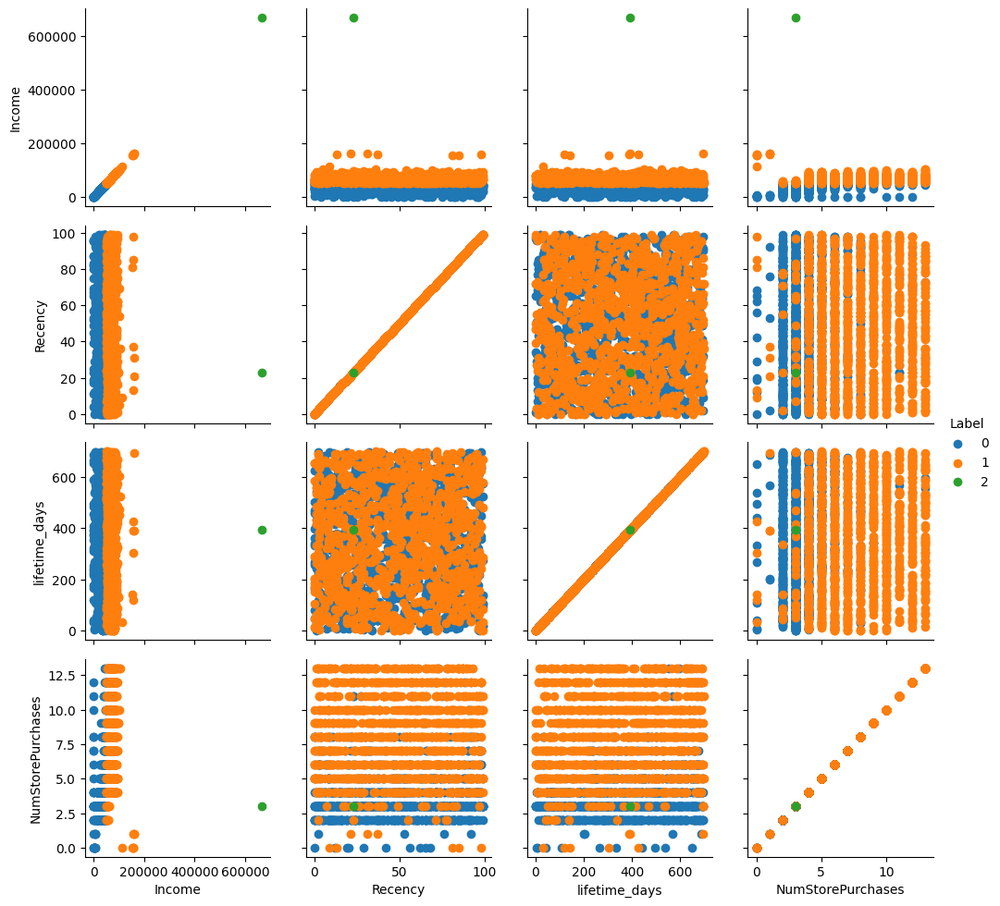

In [37]:
g = sns.PairGrid(
    data_with_clusters,
    vars=['Income', 'Recency', 'lifetime_days', 'NumStorePurchases'],
    hue='Label')
g.map(plt.scatter)
g.add_legend();

In [38]:
fig = px.scatter_3d(data, 'NumStorePurchases', 'lifetime_days', 'Recency', color = labels_raw)
fig.show()

In [39]:
fig = px.scatter_3d(data, 'Income', 'lifetime_days', 'Recency', color = labels_raw)
fig.show()

На основі отриманих візуалізацій кластерів видно, що поділ на категорії відбувається в основному на основі параметра Income

## Завдання 6

**Завдання 6**. Масштабуйте дані (StandardScaler/MinMaxScaler) і побудуйте знову кластеризацію KMeans на 3 кластери і обчисліть метрику силуету. Опишіть порівняння з експериментом без масштабування значень.

### 6.1. Масштабування

Бачимо, що значення числових колонок мають різні масштаби. Оскільки кластеризація здійснюється на основі відстаней між точками, без масштабування в даній ситуації кластер буде визначатися значенням Income, оскільки ця метрика має майбільший масштаб.

Для мінімізації впливу масштабу на кластеризацію масштабування числових колонок буде здійснене за допомогою StandardScaler, а також порівняємо роботу кластеризації при MinMaxScaler

In [40]:
standard_scaler = StandardScaler()

In [41]:
minmax_scaler = MinMaxScaler()

In [42]:
standard_scaler.fit(data)

StandardScaler()

In [43]:
minmax_scaler.fit(data)

MinMaxScaler()

In [44]:
data_std = standard_scaler.transform(data)

In [45]:
data_std_df = pd.DataFrame(data_std, columns=data.columns, index=data.index)
data_std_df.head()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
0,0.251939,-0.825218,-0.929894,0.307039,0.983781,1.551577,1.679702,2.462147,1.476500,0.843207,0.349414,1.409304,2.510890,-0.550785,0.693904,-0.28014,-0.28383,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,2.388846,-0.104069,1.531185,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,1.907271,-0.591099,-0.188676,0.997092
1,-0.208699,1.032559,0.906934,-0.383664,-0.870479,-0.636301,-0.713225,-0.650449,-0.631503,-0.729006,-0.168236,-1.110409,-0.568720,-1.166125,-0.130463,-0.28014,-0.28383,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-1.190545,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,1.907271,-0.591099,-0.188676,1.249987
2,0.778231,-0.825218,-0.929894,-0.798086,0.362723,0.570804,-0.177032,1.345274,-0.146905,-0.038766,-0.685887,1.409304,-0.226541,1.295237,-0.542647,-0.28014,-0.28383,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-0.205773,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,-0.524309,1.691765,-0.188676,0.322705
3,-0.978042,1.032559,-0.929894,-0.798086,-0.870479,-0.560857,-0.651187,-0.503974,-0.583043,-0.748179,-0.168236,-0.750450,-0.910898,-0.550785,0.281720,-0.28014,-0.28383,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-1.061881,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,-0.524309,1.691765,-0.188676,-1.278965
4,0.257993,1.032559,-0.929894,1.550305,-0.389085,0.419916,-0.216914,0.155164,-0.001525,-0.556446,1.384715,0.329427,0.115638,0.064556,-0.130463,-0.28014,-0.28383,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-0.953012,-0.315684,-0.157171,-1.006270,-0.444816,1.899751,-0.339909,-0.042295,1.261980,-0.524309,-0.591099,-0.188676,-1.026070


In [46]:
data_minmax = minmax_scaler.transform(data)

In [47]:
data_minmax_df = pd.DataFrame(data_minmax, columns=data.columns, index=data.index)
data_minmax_df.head()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
0,0.087208,0.0,0.0,0.585859,0.425318,0.442211,0.316522,0.664093,0.334601,0.243094,0.200000,0.296296,0.357143,0.307692,0.35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.948498,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.475610
1,0.069517,0.5,0.5,0.383838,0.007368,0.005025,0.003478,0.007722,0.003802,0.016575,0.133333,0.037037,0.035714,0.153846,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.161660,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.512195
2,0.107421,0.0,0.0,0.262626,0.285332,0.246231,0.073623,0.428571,0.079848,0.116022,0.066667,0.296296,0.071429,0.769231,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.446352,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.378049
3,0.039970,0.5,0.0,0.262626,0.007368,0.020101,0.011594,0.038610,0.011407,0.013812,0.133333,0.074074,0.000000,0.307692,0.30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.198856,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.146341
4,0.087441,0.5,0.0,0.949495,0.115874,0.216080,0.068406,0.177606,0.102662,0.041436,0.333333,0.185185,0.107143,0.461538,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.230329,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.182927


### 6.2. Кластеризація

In [48]:
kmeans_std = KMeans(n_clusters=3, n_init='auto')
kmeans_std.fit(data_std)

labels_std = kmeans_std.predict(data_std)
print(labels_std)

[1 2 1 ... 1 1 2]


In [49]:
kmeans_minmax = KMeans(n_clusters=3, n_init='auto')
kmeans_minmax.fit(data_minmax)

labels_minmax = kmeans_minmax.predict(data_minmax)
print(labels_minmax)

[0 2 2 ... 2 1 1]


### 6.3. Метрика силуету

In [50]:
silhouette_avg_std = silhouette_score(data_std, labels_std)
silhouette_avg_minmax = silhouette_score(data_minmax, labels_minmax)
print(f'StandardScaler Data Clasterisation Score: {silhouette_avg_std.round(4)}\nMinMaxScaler Data Clasterisation Score: {silhouette_avg_minmax.round(4)}')

StandardScaler Data Clasterisation Score: 0.1342
MinMaxScaler Data Clasterisation Score: 0.1401


Бачимо, що після масштабування метрики силутету зменшилися з приблизно 0.6 до 0.13.

Це можна пояснити тим, що зник ефект масштабу для числових даних і, відповідно, це вплинуло на обчислення середніх відстаней між точками всередині кластера та між самими кластерами. Через це метрика силуету також змінилася (зменшилася).

Оскільки найбільше мінімізує вплив масштабу метод StandardScaler, то для нього й отрималася найменша метрика силуету.

Отже, масштабування зробило кластери менш чітко вираженими за рахунок нівелювання впливу великих значень параметрів, зокрема Income

### 6.4. Візуалізація кластерів

Визначимо найбільш впливові на виділення кластерів параметри

In [51]:
data_with_clusters_std = data_std_df.copy()
data_with_clusters_std['Label'] = labels_std

data_with_clusters_minmax = data_minmax_df.copy()
data_with_clusters_minmax['Label'] = labels_minmax

In [52]:
cluster_profile_std = data_with_clusters_std.groupby('Label').mean()
cluster_profile_minmax = data_with_clusters_minmax.groupby('Label').mean()

print('StandardScaler Data Mean Cluster Values')
display(cluster_profile_std)
print('\nMinMaxScaler Data Mean Cluster Values')
display(cluster_profile_minmax)

StandardScaler Data Mean Cluster Values


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
Label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.373074,0.289448,-0.018827,-0.227289,-0.147746,-0.370939,-0.366765,-0.391921,-0.421575,0.270001,0.080236,-0.021893,-0.023971,-0.536017,0.585087,3.569640,-0.283830,-0.126149,-0.131638,0.231467,-0.014268,0.0,0.0,0.839129,-0.104069,0.033383,-0.064878,0.155774,-0.110252,-0.013946,0.133524,0.080172,-0.042295,-0.036392,0.078722,-0.061474,-0.056946,-0.160156
1,0.809772,-0.708001,-0.184230,0.032485,0.896442,0.796328,0.907936,0.819926,0.795091,0.607512,-0.195968,0.604538,0.927498,0.872923,-0.719788,-0.105984,0.237375,0.443985,0.378605,0.142402,-0.010809,0.0,0.0,0.206382,-0.046253,0.101717,-0.033694,-0.149409,0.072323,-0.050493,0.036825,0.015628,0.014098,-0.044023,0.008322,0.001359,0.066159,0.137349
2,-0.496921,0.438070,0.123221,0.000882,-0.576112,-0.488273,-0.562212,-0.501763,-0.482494,-0.426714,0.121242,-0.396138,-0.608708,-0.522552,0.416852,-0.280140,-0.128562,-0.280140,-0.236528,-0.116510,0.008520,0.0,0.0,-0.218237,0.040675,-0.070287,0.028559,0.083162,-0.036839,0.034633,-0.037352,-0.018156,-0.005142,0.032571,-0.013201,0.005132,-0.038004,-0.074787



MinMaxScaler Data Mean Cluster Values


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
Label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.116169,0.015873,0.071429,0.447651,0.533891,0.314649,0.273743,0.342097,0.244583,0.215064,0.088360,0.208407,0.215420,0.621490,0.173016,0.166667,0.293651,0.575397,0.416667,0.087302,0.003968,0.0,0.0,0.742063,0.007937,0.570850,0.079365,0.000000,0.484127,0.158730,0.277778,0.130952,0.003968,0.313492,0.277778,0.218254,0.055556,0.341947
1,0.071787,0.249237,0.283316,0.490541,0.172787,0.088929,0.067426,0.099255,0.067199,0.092776,0.164259,0.141065,0.077714,0.417795,0.279095,0.062055,0.048830,0.007121,0.014242,0.006104,0.006104,0.0,0.0,0.084435,0.012208,0.484503,0.186165,0.054934,0.000000,0.335707,0.423194,0.095626,0.003052,0.393693,0.196338,0.278739,0.032553,0.340459
2,0.073464,0.247264,0.269154,0.513584,0.150861,0.128713,0.081125,0.140068,0.102295,0.126374,0.162653,0.146969,0.081876,0.428243,0.276119,0.059701,0.044776,0.010945,0.024876,0.001990,0.013930,0.0,0.0,0.063682,0.009950,0.510409,0.000000,0.000000,1.000000,0.000000,0.000000,0.104478,0.000000,0.396020,0.218905,0.249751,0.030846,0.319816


In [53]:
feature_diff_std = cluster_profile_std.max() - cluster_profile_std.min()
print('StandardScaler Data Mean Cluster Value Difference')
display(feature_diff_std.sort_values(ascending=False))

feature_diff_minmax = cluster_profile_minmax.max() - cluster_profile_minmax.min()
print('\nMinMaxScaler Data Mean Cluster Value Difference')
display(feature_diff_minmax.sort_values(ascending=False))

StandardScaler Data Mean Cluster Value Difference


,0
AcceptedCmp3,3.849780
NumCatalogPurchases,1.536206
MntWines,1.472554
MntMeatProducts,1.470148
NumStorePurchases,1.408940
MntFishProducts,1.321688
Income,1.306693
NumWebVisitsMonth,1.304875
MntFruits,1.284601
MntSweetProducts,1.277585



MinMaxScaler Data Mean Cluster Value Difference


,0
Education_Graduation,1.000000
Response,0.678382
AcceptedCmp5,0.568276
Education_PhD,0.423194
AcceptedCmp1,0.402425
MntWines,0.383030
Education_Master,0.335707
AcceptedCmp4,0.248875
MntFishProducts,0.242842
Kidhome,0.233364


In [54]:
n_noise_std = list(labels_std).count(-1)
n_noise_minmax = list(labels_minmax).count(-1)
print('Estimated number of noise points (StandardScaler): %d' % n_noise_std)
print('Estimated number of noise points (MinMaxScaler): %d' % n_noise_minmax)

Estimated number of noise points (StandardScaler): 0
Estimated number of noise points (MinMaxScaler): 0


Отримали наступні найбільш впливові параметри для формування кластерів для кожного методу масштабування

1) StandardScaler:
- MntMeatProducts
- NumCatalogPurchases
- MntFishProducts
- MntWines
- Income
- MntFruits
- MntSweetProducts
- NumStorePurchases
- NumWebPurchases
- NumWebVisitsMonth
- Teenhome
- Kidhome
- NumDealsPurchases
- MntGoldProds


З них для зображення кластерів оберемо кілька метрик, які відображають групи з окремим бізнес-сенсом: MntMeatProducts, NumCatalogPurchases, Income, NumWebVisitsMonth, Teenhome


2) MinMaxScaler:
- Education_Graduation
- clean_Marital_Status_Married
- Education_PhD
- clean_Marital_Status_Together
- clean_Marital_Status_Single
- Education_Master
- Education_2n Cycle
- clean_Marital_Status_Divorced
- Response


З них для зображення кластерів оберемо кілька метрик: Education_Graduation, clean_Marital_Status_Married, Education_PhD, clean_Marital_Status_Together

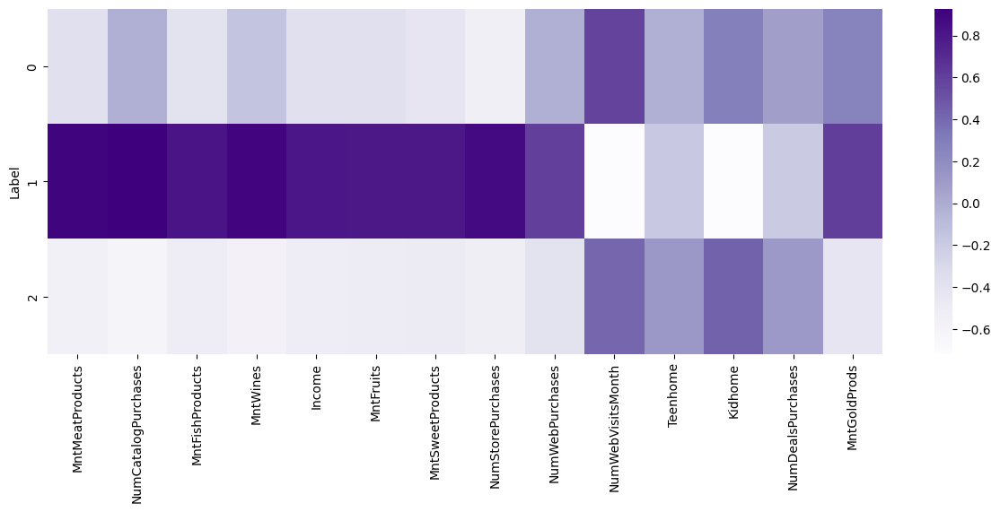

In [55]:
#StandardScaler
filter_col_names_std = ['MntMeatProducts', 'NumCatalogPurchases', 'MntFishProducts', 'MntWines', 'Income', 'MntFruits', 'MntSweetProducts', 'NumStorePurchases', 'NumWebPurchases', 'NumWebVisitsMonth', 'Teenhome', 'Kidhome', 'NumDealsPurchases', 'MntGoldProds']
plt.figure(figsize=(15,5))
sns.heatmap(data_with_clusters_std[filter_col_names_std].groupby(data_with_clusters_std['Label']).mean(), cmap="Purples");
plt.show()

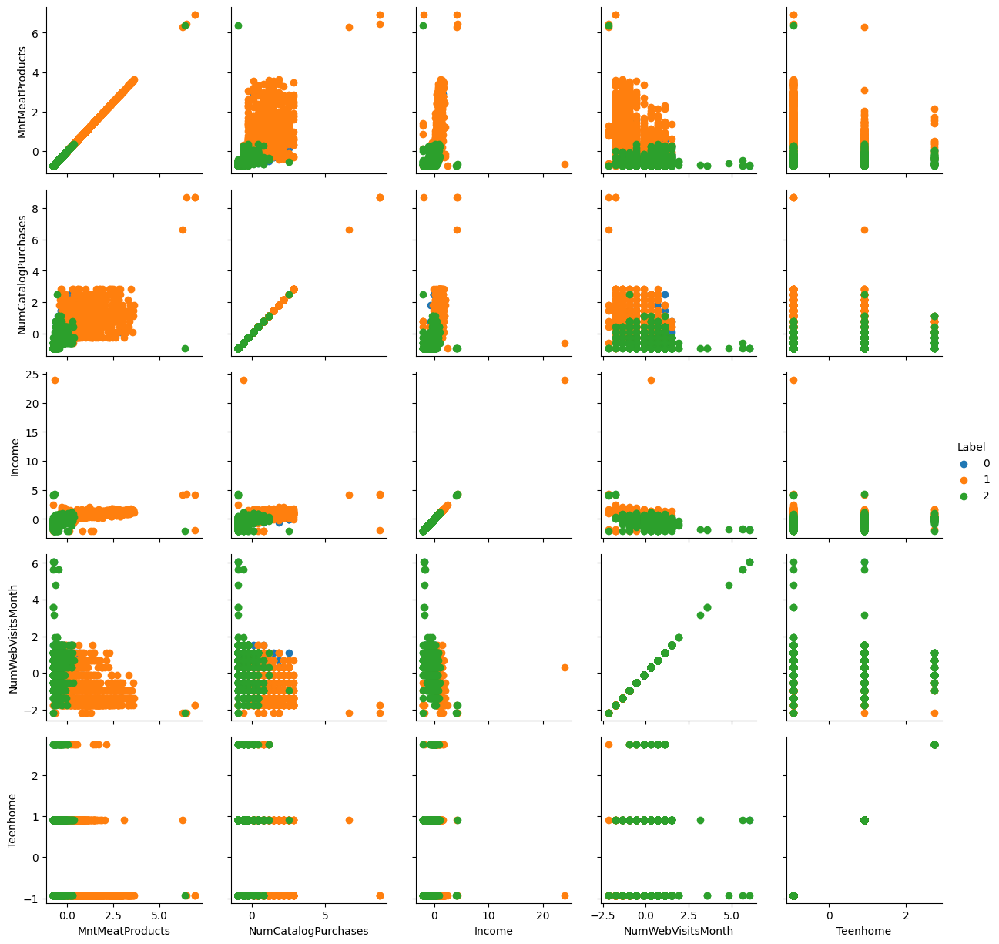

In [56]:
# StandardScaler
g = sns.PairGrid(
    data_with_clusters_std,
    vars=['MntMeatProducts', 'NumCatalogPurchases', 'Income', 'NumWebVisitsMonth', 'Teenhome'],
    hue='Label')
g.map(plt.scatter)
g.add_legend();

Для кодування StandardScaler досить важко візуалізувати чітко окремі кластери. Теплова карта дає більш чітке розуміння характеристик сформованих кластерів:  
Кластер 1 (Label 1) - клієнти, які найбільше витрачають на покупки, мають високий дохід, зазвичай не мають дітей та підлітків  
Кластер 2 (Label 0) - середній сегмент сум витрат на покупки, середній дохід  
Кластер 3 (Label 2) - клієнти, які мало купують, низький дохід  


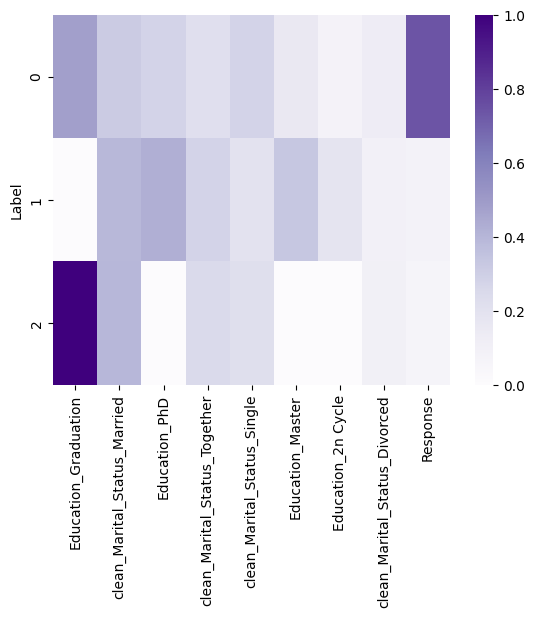

In [57]:
#MinMaxScaler
filter_col_names_minmax = ['Education_Graduation', 'clean_Marital_Status_Married', 'Education_PhD', 'clean_Marital_Status_Together', 'clean_Marital_Status_Single', 'Education_Master', 'Education_2n Cycle', 'clean_Marital_Status_Divorced', 'Response']
sns.heatmap(data_with_clusters_minmax[filter_col_names_minmax].groupby(data_with_clusters_minmax['Label']).mean(), cmap="Purples");

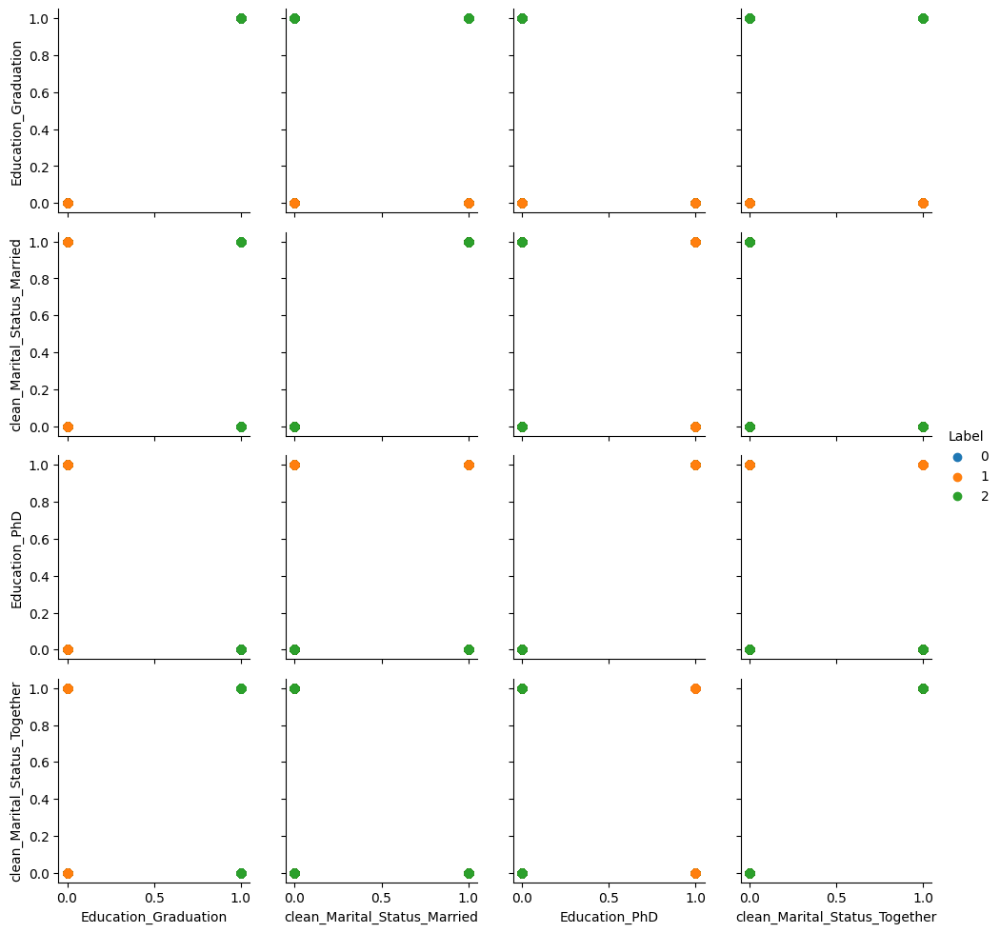

In [58]:
g = sns.PairGrid(
    data_with_clusters_minmax,
    vars=['Education_Graduation', 'clean_Marital_Status_Married', 'Education_PhD', 'clean_Marital_Status_Together'],
    hue='Label')
g.map(plt.scatter)
g.add_legend();

Для кодування MinMaxScaler також досить важко візуалізувати чітко окремі кластери. Теплова карта також не дає чіткого розуміння принципу поділи на кластери


## Завдання 7

**Завдання 7.** З візуалізацій на попередньому кроці ви могли побачити якісь викиди в даних. Опрацюйте викиди (можна видалити ці рядки або придумати інший спосіб).

In [59]:
data_with_clusters.Income.max()

666666.0

На візуалізації немасштабованих даних видно, що один із кластерів має лише одну віддалену точку - це точка з нийвищим значенням Income. Дану точку можемо вважати викидом.

Створимо копію немасштабованого масиву даних, замінивши викид значенням -1, яке відповідає пропуску в даних по Income

In [60]:
data_no_outl = data.copy()
data_no_outl.Income = data_no_outl.Income.replace(666666.0, -1)

Здійснимо кластеризацію для даних без масштабування та з масштабуванням та порівняємо результати

### 7.1. Кластеризація для даних без масштабування

In [61]:
kmeans_raw_clean = KMeans(n_clusters=3, n_init='auto')
kmeans_raw_clean.fit(data_no_outl)

labels_raw_clean = kmeans_raw_clean.predict(data_no_outl)
print(labels_raw_clean)

n_noise_raw_clean = list(labels_raw_clean).count(-1)
print('Estimated number of noise points: %d' % n_noise_raw_clean)

silhouette_avg_raw_clean = silhouette_score(data_no_outl, labels_raw_clean)
print(f'Raw Clean Data Clasterisation Score: {silhouette_avg_raw_clean.round(4)}')

[2 2 1 ... 2 1 2]
Estimated number of noise points: 0
Raw Clean Data Clasterisation Score: 0.5343


In [62]:
data_with_clusters_clean = data_no_outl.copy()
data_with_clusters_clean['Label'] = labels_raw_clean

cluster_profile_raw_clean = data_with_clusters_clean.groupby('Label').mean()
print('Raw Clean Data Mean Cluster Values')
display(cluster_profile_raw_clean)

feature_diff_clean = cluster_profile_raw_clean.max() - cluster_profile_raw_clean.min()
print('Raw Clean Data Mean Cluster Value Difference')
display(feature_diff_clean.sort_values(ascending=False))

Raw Clean Data Mean Cluster Values


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
Label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,26932.675712,0.808684,0.316147,48.614654,34.462687,6.335142,29.164179,9.662144,6.754410,18.419267,2.151967,2.176391,0.565807,3.116689,6.850746,0.081411,0.008141,0.001357,0.004071,0.000000,0.014925,3.0,11.0,0.109905,0.032564,353.075984,0.116689,0.07327,0.502035,0.146540,0.161465,0.088195,0.000000,0.394844,0.241520,0.257802,0.017639,41.037992
1,76788.539455,0.090387,0.355811,49.070301,616.530846,56.853659,395.163558,82.335725,59.753228,70.367288,1.629842,5.420373,5.414634,8.397418,3.192253,0.070301,0.133429,0.226686,0.180775,0.025825,0.007174,3.0,11.0,0.235294,0.000000,342.167862,0.074605,0.00000,0.532281,0.152080,0.241033,0.103300,0.002869,0.387374,0.203730,0.261119,0.041607,46.513630
2,51789.359801,0.416873,0.810174,49.595533,280.018610,18.140199,95.589330,24.253102,17.363524,44.650124,3.084367,4.674938,2.198511,5.980149,5.750620,0.066998,0.084367,0.004963,0.018610,0.014888,0.006203,3.0,11.0,0.110422,0.000000,363.915633,0.080645,0.00000,0.478908,0.193548,0.246898,0.117866,0.002481,0.375931,0.202233,0.258065,0.043424,47.791563


Raw Clean Data Mean Cluster Value Difference


,0
Income,49855.863742
MntWines,582.068160
MntMeatProducts,365.999379
MntFishProducts,72.673581
MntSweetProducts,52.998818
MntGoldProds,51.948021
MntFruits,50.518516
lifetime_days,21.747770
Customer_Age,6.753571
NumStorePurchases,5.280728


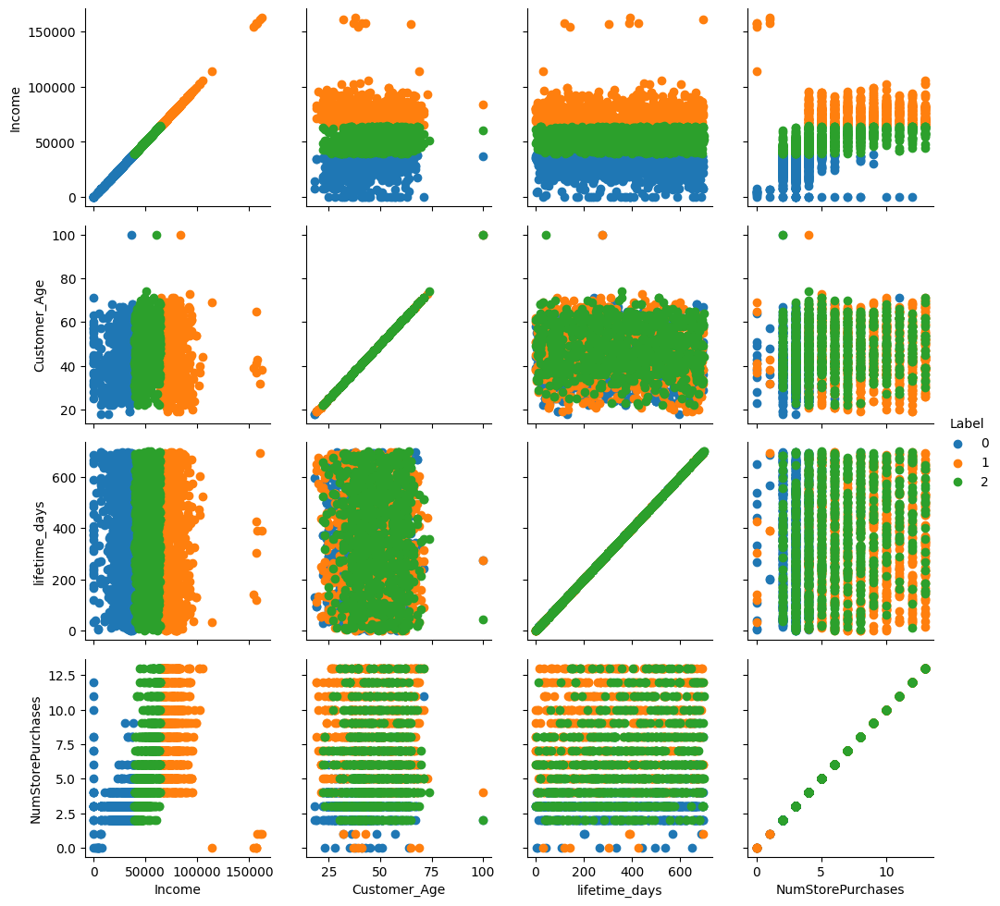

In [63]:
g = sns.PairGrid(
    data_with_clusters_clean,
    vars=['Income', 'Customer_Age', 'lifetime_days', 'NumStorePurchases'],
    hue='Label')
g.map(plt.scatter)
g.add_legend();

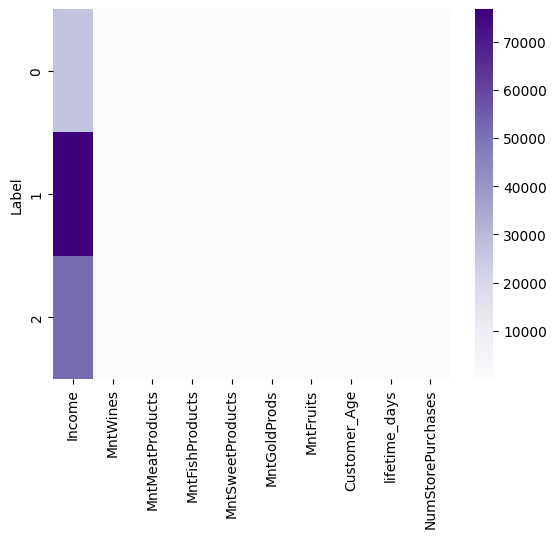

In [64]:
filter_col_names_clean = ['Income', 'MntWines', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'MntFruits','Customer_Age', 'lifetime_days', 'NumStorePurchases']
sns.heatmap(data_with_clusters_clean[filter_col_names_clean].groupby(data_with_clusters_clean['Label']).mean(), cmap="Purples");

Бачимо, що масштаб все ще відіграє ключову роль у визначенні кластерів, тому поділ відбувся за значеннями Income - отримали кластери високого, середнього та низького доходу.

### 7.2. Кластеризація для даних StandardScaler

In [65]:
standard_scaler_clean = StandardScaler()
standard_scaler_clean.fit(data_no_outl)

data_std_clean = standard_scaler_clean.transform(data_no_outl)
data_std_df_clean = pd.DataFrame(data_std_clean, columns=data_no_outl.columns, index=data_no_outl.index)
data_std_df_clean.head()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
0,0.305534,-0.825218,-0.929894,0.307039,0.983781,1.551577,1.679702,2.462147,1.476500,0.843207,0.349414,1.409304,2.510890,-0.550785,0.693904,-0.28014,-0.28383,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,2.388846,-0.104069,1.531185,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,1.907271,-0.591099,-0.188676,0.997092
1,-0.228458,1.032559,0.906934,-0.383664,-0.870479,-0.636301,-0.713225,-0.650449,-0.631503,-0.729006,-0.168236,-1.110409,-0.568720,-1.166125,-0.130463,-0.28014,-0.28383,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-1.190545,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,1.907271,-0.591099,-0.188676,1.249987
2,0.915636,-0.825218,-0.929894,-0.798086,0.362723,0.570804,-0.177032,1.345274,-0.146905,-0.038766,-0.685887,1.409304,-0.226541,1.295237,-0.542647,-0.28014,-0.28383,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-0.205773,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,-0.524309,1.691765,-0.188676,0.322705
3,-1.120316,1.032559,-0.929894,-0.798086,-0.870479,-0.560857,-0.651187,-0.503974,-0.583043,-0.748179,-0.168236,-0.750450,-0.910898,-0.550785,0.281720,-0.28014,-0.28383,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-1.061881,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,-0.524309,1.691765,-0.188676,-1.278965
4,0.312552,1.032559,-0.929894,1.550305,-0.389085,0.419916,-0.216914,0.155164,-0.001525,-0.556446,1.384715,0.329427,0.115638,0.064556,-0.130463,-0.28014,-0.28383,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-0.953012,-0.315684,-0.157171,-1.006270,-0.444816,1.899751,-0.339909,-0.042295,1.261980,-0.524309,-0.591099,-0.188676,-1.026070


In [66]:
kmeans_std_clean = KMeans(n_clusters=3, n_init='auto')
kmeans_std_clean.fit(data_std_clean)

labels_std_clean = kmeans_std_clean.predict(data_std_clean)
print(labels_std_clean)

n_noise_std_clean = list(labels_std_clean).count(-1)
print('Estimated number of noise points: %d' % n_noise_std_clean)

silhouette_avg_std_clean = silhouette_score(data_std_clean, labels_std_clean)
print(f'StandardScaler Clean Data Clasterisation Score: {silhouette_avg_std_clean.round(4)}')

[2 0 1 ... 1 1 0]
Estimated number of noise points: 0
StandardScaler Clean Data Clasterisation Score: 0.1059


In [67]:
data_with_clusters_clean_std = data_std_df_clean.copy()
data_with_clusters_clean_std['Label'] = labels_std_clean

cluster_profile_std_clean = data_with_clusters_clean_std.groupby('Label').mean()
print('StandardScaler Clean Data Mean Cluster Values')
display(cluster_profile_std_clean)

feature_diff_clean_std = cluster_profile_std_clean.max() - cluster_profile_std_clean.min()
print('StandardScaler Clean Data Mean Cluster Value Difference')
display(feature_diff_clean_std.sort_values(ascending=False))

StandardScaler Clean Data Mean Cluster Values


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
Label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.784628,0.659200,-0.127397,0.005946,-0.781976,-0.536686,-0.628871,-0.553196,-0.530678,-0.547753,-0.147631,-0.713406,-0.723863,-0.801402,0.474206,0.003921,-0.254261,-0.280140,-0.258153,-0.099618,0.033687,0.0,0.0,-0.159672,0.037384,-0.153775,0.069858,0.178308,-0.023726,-0.013423,-0.074134,-0.027652,-0.042295,0.001425,0.051715,-0.001544,-0.060783,-0.253962
1,0.273440,-0.400012,0.754570,-0.021920,0.452413,-0.080843,-0.139397,-0.123386,-0.065729,0.305706,0.692129,0.807160,0.134560,0.590100,0.143059,-0.049508,0.224948,-0.226918,-0.143112,0.003758,-0.033523,0.0,0.0,-0.112422,0.000373,0.238422,-0.128404,-0.147156,-0.072304,0.084671,0.155616,0.078518,0.030471,0.047020,-0.147060,0.008548,0.047400,0.387709
2,1.127294,-0.748780,-0.644019,0.014571,0.913979,1.083032,1.321080,1.162999,1.054362,0.653257,-0.534018,0.374502,1.177066,0.789425,-1.040364,0.050431,0.206525,0.780443,0.642331,0.179177,-0.023030,0.0,0.0,0.425132,-0.069317,0.005680,0.020817,-0.157171,0.127921,-0.073874,-0.044630,-0.040489,0.042447,-0.057384,0.075973,-0.007110,0.056796,0.016426


StandardScaler Clean Data Mean Cluster Value Difference


,0
MntMeatProducts,1.949951
Income,1.911923
NumCatalogPurchases,1.900929
MntFishProducts,1.716195
MntWines,1.695954
MntFruits,1.619718
NumStorePurchases,1.590827
MntSweetProducts,1.585040
NumWebPurchases,1.520566
NumWebVisitsMonth,1.514570


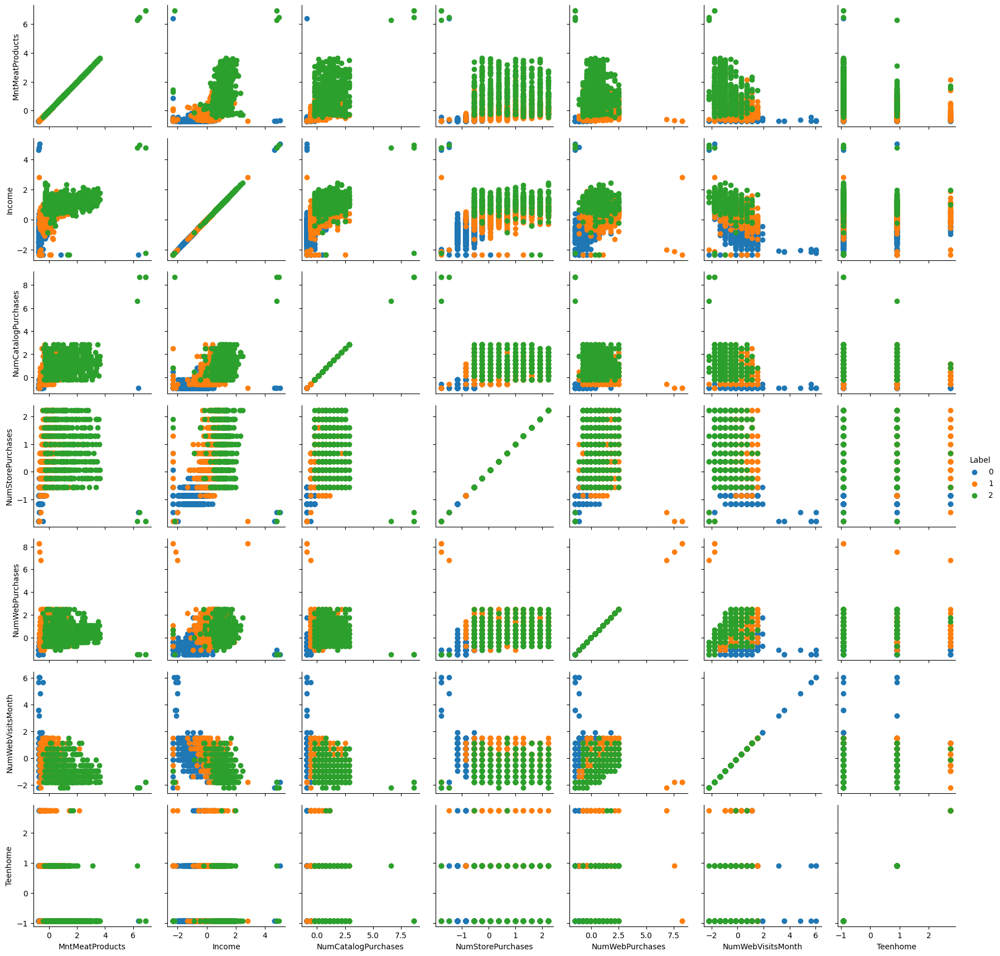

In [68]:
g = sns.PairGrid(
    data_with_clusters_clean_std,
    vars=['MntMeatProducts', 'Income', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebPurchases', 'NumWebVisitsMonth','Teenhome'],
    hue='Label')
g.map(plt.scatter)
g.add_legend();

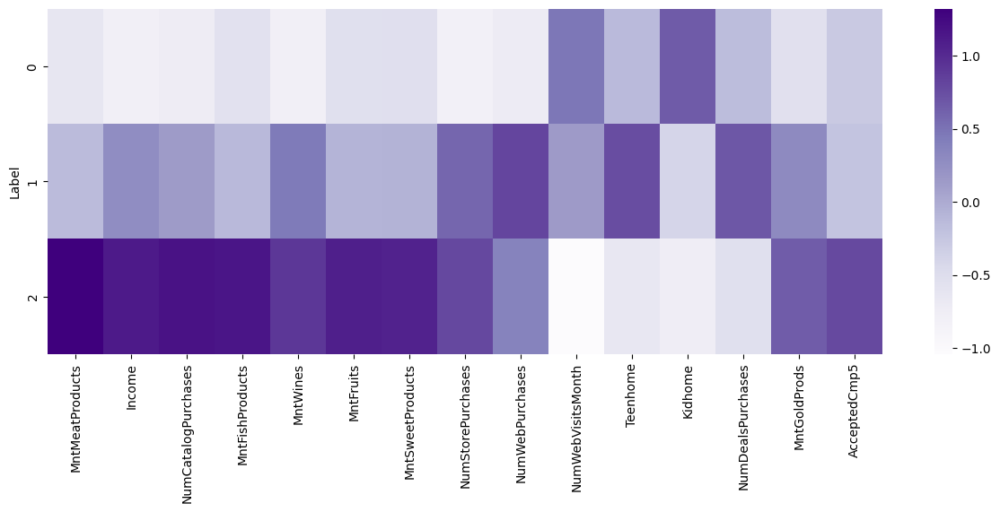

In [69]:
filter_col_names_clean_std = ['MntMeatProducts', 'Income', 'NumCatalogPurchases', 'MntFishProducts', 'MntWines', 'MntFruits', 'MntSweetProducts', 'NumStorePurchases', 'NumWebPurchases', 'NumWebVisitsMonth','Teenhome', 'Kidhome', 'NumDealsPurchases', 'MntGoldProds', 'AcceptedCmp5']
plt.figure(figsize=(15,5))
sns.heatmap(data_with_clusters_clean_std[filter_col_names_clean_std].groupby(data_with_clusters_clean_std['Label']).mean(), cmap="Purples")
plt.show()

Для кластеризації на основі даних, відмасштабованих з StandardScaler, бачимо, що без викиду в Income кластери розділяються чіткіше, ніж при наявності викиду.

Таким чином, можна виокремити наступні кластери:  
- **Кластер 1 (Label 0)** - найменше витрат, найменший дохід, найбільша кількість відвідувань на сайті (NumWebVisitsMonth), найбільша кількість дітей в домогосподарстві, середня кількість покупок за знижками.
  
  Даний кластер можна умовно назвати кластером з онлайн-клієнтами, які взаємодіють з магазином здебільшого через сайт, проте майже не здійснюють покупок, при покупках в середньому користуються знижками.      


- **Кластер 2 (Label 1)** - середні суми витрат та середній дохід, найбільша кількість онлайн-покупок (NumWebPurchases), середня кількість покупок у фізичному магазині, найбільша кількість підлітків у домашньому господарстві, найбільша кількість покупок з використанням знижок (NumDealsPurchases).  

  Даний кластер можна умовно назвати кластером онлайн-клієнтів, які здійснюють покупки переважно на сайті, менше - у фізичному магазині, та надають перевагу знижкам. До даного кластеру також можуть входити підлітки.


- **Кластер 3 (Label 2)** - найбільші суми витрат та доходу, середня кількість онлайн покупок та найбільша кількість покупок в магазині та за каталогом, найменшою кількістю відвідувань сайту та найменшою кількістю покупок за знижками та з найбільшою кількістю прийнятих пропозицій у 5-й кампанії.

  Даний кластер можна умовно назвати кластером офлайн-клієнтів, які мають найбільші доходи та витрати, найбільше користуються каталогом та найменше користуються сайтом, а також мають найменше дітей/підлітків.

### 7.3. Кластеризація для даних MinMaxScaler

In [70]:
minmax_scaler_clean = MinMaxScaler()
minmax_scaler_clean.fit(data_no_outl)

data_minmax_clean = minmax_scaler_clean.transform(data_no_outl)
data_minmax_df_clean = pd.DataFrame(data_minmax_clean, columns=data_no_outl.columns, index=data_no_outl.index)
data_minmax_df_clean.head()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
0,0.358003,0.0,0.0,0.585859,0.425318,0.442211,0.316522,0.664093,0.334601,0.243094,0.200000,0.296296,0.357143,0.307692,0.35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.948498,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.475610
1,0.285379,0.5,0.5,0.383838,0.007368,0.005025,0.003478,0.007722,0.003802,0.016575,0.133333,0.037037,0.035714,0.153846,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.161660,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.512195
2,0.440978,0.0,0.0,0.262626,0.285332,0.246231,0.073623,0.428571,0.079848,0.116022,0.066667,0.296296,0.071429,0.769231,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.446352,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.378049
3,0.164085,0.5,0.0,0.262626,0.007368,0.020101,0.011594,0.038610,0.011407,0.013812,0.133333,0.074074,0.000000,0.307692,0.30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.198856,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.146341
4,0.358958,0.5,0.0,0.949495,0.115874,0.216080,0.068406,0.177606,0.102662,0.041436,0.333333,0.185185,0.107143,0.461538,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.230329,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.182927


In [71]:
kmeans_minmax_clean = KMeans(n_clusters=3, n_init='auto')
kmeans_minmax_clean.fit(data_minmax_clean)

labels_minmax_clean = kmeans_minmax_clean.predict(data_minmax_clean)
print(labels_minmax_clean)

n_noise_minmax_clean = list(labels_minmax_clean).count(-1)
print('Estimated number of noise points: %d' % n_noise_minmax_clean)

silhouette_avg_minmax_clean = silhouette_score(data_minmax_clean, labels_minmax_clean)
print(f'MinMaxScaler Clean Data Clasterisation Score: {silhouette_avg_minmax_clean.round(4)}')

[2 2 0 ... 2 0 1]
Estimated number of noise points: 0
MinMaxScaler Clean Data Clasterisation Score: 0.1489


In [72]:
data_with_clusters_clean_minmax = data_minmax_df_clean.copy()
data_with_clusters_clean_minmax['Label'] = labels_minmax_clean

cluster_profile_minmax_clean = data_with_clusters_clean_minmax.groupby('Label').mean()
print('MinMaxScaler Clean Data Mean Cluster Values')
display(cluster_profile_minmax_clean)

feature_diff_clean_minmax = cluster_profile_minmax_clean.max() - cluster_profile_minmax_clean.min()
print('MinMaxScaler Clean Data Mean Cluster Value Difference')
display(feature_diff_clean_minmax.sort_values(ascending=False))

MinMaxScaler Clean Data Mean Cluster Values


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
Label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.316842,0.225000,0.264655,0.506130,0.205510,0.127387,0.097451,0.150546,0.099325,0.118770,0.154943,0.151149,0.095567,0.441247,0.263017,0.063793,0.074138,0.075862,0.055172,0.020690,0.008621,0.0,0.0,0.103448,0.012069,0.509040,0.098276,0.024138,0.493103,0.182759,0.201724,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.344239
1,0.318233,0.223443,0.256410,0.478620,0.222279,0.111013,0.090841,0.121544,0.087754,0.104746,0.156125,0.151675,0.093319,0.446980,0.267399,0.073260,0.079365,0.075702,0.065934,0.010989,0.007326,0.0,0.0,0.186813,0.008547,0.499756,0.178266,0.048840,0.000000,0.322344,0.450549,0.137973,0.003663,0.526252,0.280830,0.0,0.051282,0.337830
2,0.314443,0.218787,0.241974,0.506083,0.184023,0.156078,0.102108,0.163714,0.120118,0.139984,0.153944,0.151011,0.096441,0.446721,0.266231,0.078478,0.070155,0.067776,0.068966,0.010702,0.011891,0.0,0.0,0.143876,0.011891,0.509558,0.000000,0.000000,1.000000,0.000000,0.000000,0.141498,0.001189,0.514863,0.300832,0.0,0.041617,0.316189


MinMaxScaler Clean Data Mean Cluster Value Difference


,0
Education_Graduation,1.000000
clean_Marital_Status_Together,1.000000
clean_Marital_Status_Married,0.526252
Education_PhD,0.450549
Education_Master,0.322344
clean_Marital_Status_Single,0.300832
Education_2n Cycle,0.178266
clean_Marital_Status_Divorced,0.141498
Response,0.083365
clean_Marital_Status_Widow,0.051282


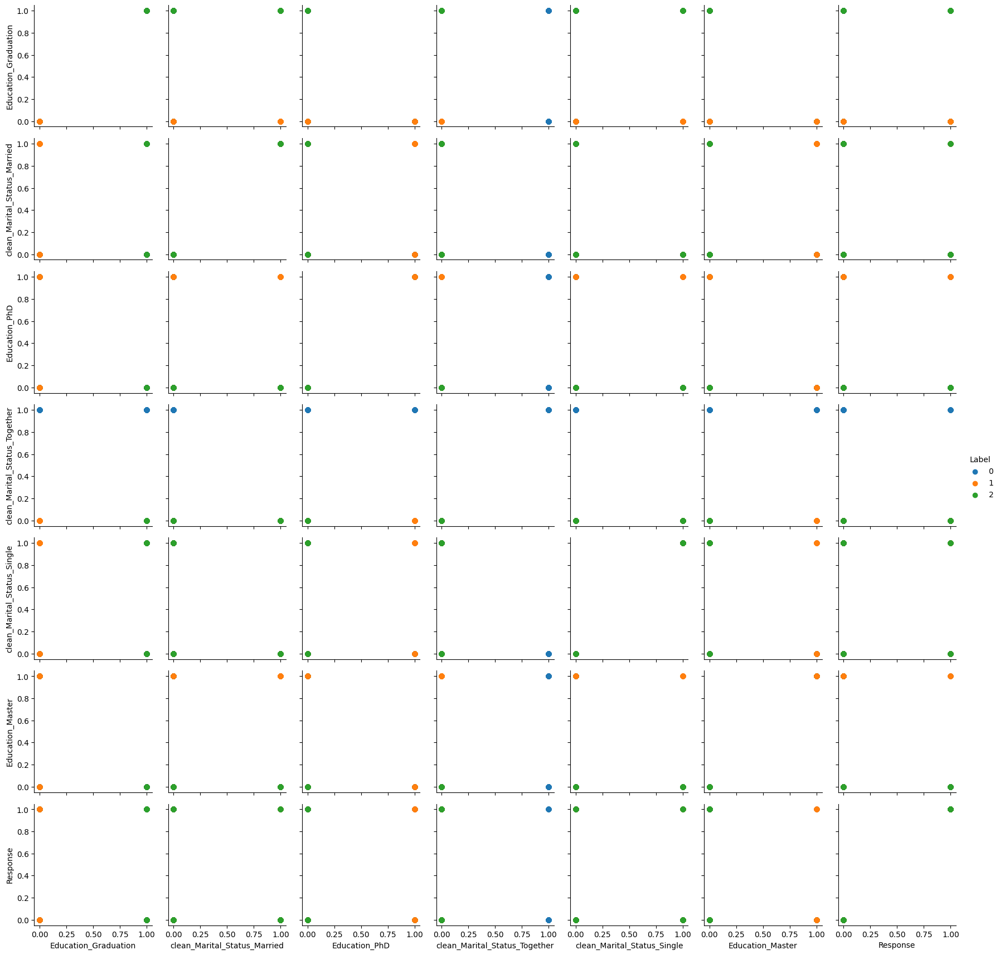

In [73]:
g = sns.PairGrid(
    data_with_clusters_clean_minmax,
    vars=['Education_Graduation', 'clean_Marital_Status_Married', 'Education_PhD', 'clean_Marital_Status_Together', 'clean_Marital_Status_Single','Education_Master', 'Response'],
    hue='Label')
g.map(plt.scatter)
g.add_legend();

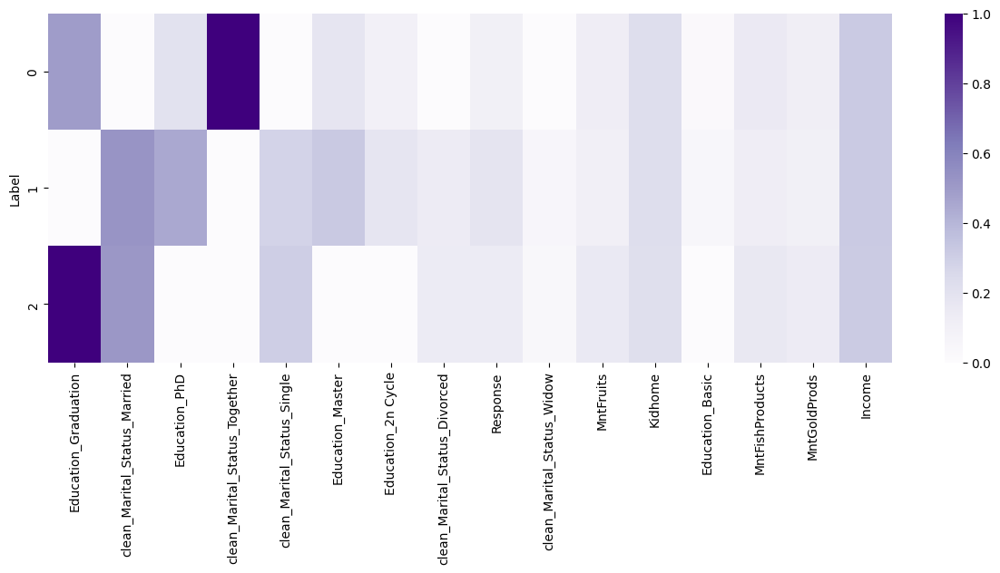

In [74]:
filter_col_names_clean_minmax = ['Education_Graduation', 'clean_Marital_Status_Married', 'Education_PhD', 'clean_Marital_Status_Together', 'clean_Marital_Status_Single', 'Education_Master', 'Education_2n Cycle', 'clean_Marital_Status_Divorced', 'Response', 'clean_Marital_Status_Widow','MntFruits', 'Kidhome', 'Education_Basic', 'MntFishProducts', 'MntGoldProds', 'Income']
plt.figure(figsize=(15,5))
sns.heatmap(data_with_clusters_clean_minmax[filter_col_names_clean_minmax].groupby(data_with_clusters_clean_minmax['Label']).mean(), cmap="Purples")
plt.show()

Бачимо, що для методу масштабування MinMaxScaler навіть за відсутності викидів важко визначити критерії створення кластерів.

Отже, для продовження роботи над кластеризацією оберемо кластеризацію на даних **без викиду в Income** та з масштабуванням даних за допомогою **StandardScaler**

## Завдання 8

**Завдання 8.** Виконайте Elbow method для пошуку оптимальної кількості кластерів та натренуйте KMeans з тою кількістю кластерів, яку Elbow method показав як оптимальну. Обчисліть метрику силуету. Візуалізуйте кластери. З яким набором даних (масштабованим чи ні) тут працювати - ваш вибір, можна зробити експеримент з обома.

### 8.1. Elbow Method

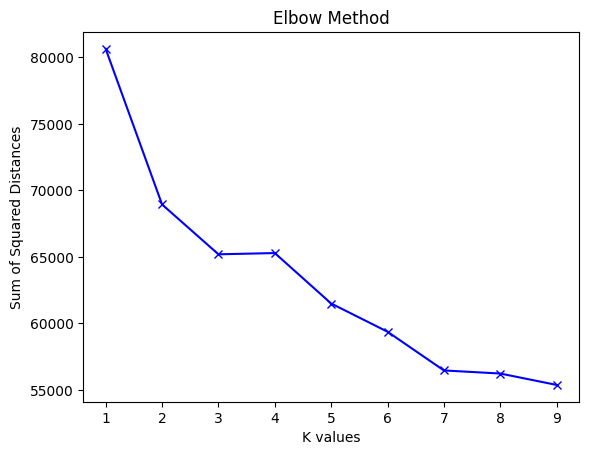

In [75]:
K = range(1,10)
sum_of_squared_distances = []

for k in K:
    model = KMeans(n_clusters=k, n_init='auto').fit(data_std_clean)
    sum_of_squared_distances.append(model.inertia_)

plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('K values')
plt.ylabel('Sum of Squared Distances')
plt.title('Elbow Method')
plt.show()

Нв візуалізації отримали два "переломні" моменти у значеннях сум квадратів відстаней: для K=3 та для К=7.

Оскільки для К=3 кластеризація вже здійснена, натренуємо також кластеризацію для К=7

###8.2. Кластеризація

In [76]:
kmeans_std_clean_k7 = KMeans(n_clusters=7, n_init='auto')
kmeans_std_clean_k7.fit(data_std_clean)

labels_std_clean_k7 = kmeans_std_clean_k7.predict(data_std_clean)
print(labels_std_clean_k7)

n_noise_std_clean_k7 = list(labels_std_clean_k7).count(-1)
print('Estimated number of noise points: %d' % n_noise_std_clean_k7)

silhouette_avg_std_clean_k7 = silhouette_score(data_std_clean, labels_std_clean_k7)
print(f'StandardScaler Clean Data Clasterisation Score: {silhouette_avg_std_clean_k7.round(4)}')

[3 1 3 ... 2 2 1]
Estimated number of noise points: 0
StandardScaler Clean Data Clasterisation Score: 0.1299


Бачимо покращення метрики силуету з 0.1059 до 0.1299

In [80]:
data_with_clusters_clean_std_k7 = data_std_df_clean.copy()
data_with_clusters_clean_std_k7['Label'] = labels_std_clean_k7

cluster_profile_std_clean_k7 = data_with_clusters_clean_std_k7.groupby('Label').mean()
print('StandardScaler Clean Data Mean Cluster Values')
display(cluster_profile_std_clean_k7)

feature_diff_clean_std_k7 = cluster_profile_std_clean_k7.max() - cluster_profile_std_clean_k7.min()
print('StandardScaler Clean Data Mean Cluster Value Difference')
display(feature_diff_clean_std_k7.sort_values(ascending=False))

StandardScaler Clean Data Mean Cluster Values


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
Label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1.390137,-0.723884,-0.707249,0.015688,1.712519,0.755985,1.359974,0.729968,0.947113,0.648452,-0.663926,0.484318,1.179503,0.737701,-0.954831,0.279828,1.169776,3.359652,1.591200,0.990691,-0.034393,0.0,0.0,1.214818,-0.104069,0.013944,-0.062345,-0.157171,0.048296,-0.020474,0.061769,-0.061446,0.101253,0.091602,-0.052730,0.017665,-0.088881,-0.076819
1,-0.738769,0.691664,-0.130146,0.020221,-0.784727,-0.541115,-0.636026,-0.560851,-0.538004,-0.554635,-0.158681,-0.718793,-0.729592,-0.803335,0.471029,0.004100,-0.259028,-0.280140,-0.257684,-0.097619,0.049187,0.0,0.0,-0.156461,-0.104069,-0.197907,0.096576,-0.157171,0.020895,0.023013,-0.054856,0.002176,-0.042295,0.030687,0.056524,-0.006130,-0.188676,-0.264821
2,0.256719,-0.359155,0.817333,-0.036628,0.423681,-0.166419,-0.180599,-0.218807,-0.198066,0.256750,0.775979,0.753978,0.093581,0.542678,0.211347,-0.052104,0.213608,-0.266726,-0.141355,-0.010420,-0.024970,0.0,0.0,-0.110476,-0.104069,0.251119,-0.133624,-0.157171,-0.075938,0.099402,0.154117,0.106061,0.040232,0.066571,-0.143051,0.061148,-0.188676,0.376456
3,0.977664,-0.730169,-0.506997,-0.010765,0.563511,1.120259,1.161049,1.229925,1.046616,0.615579,-0.419838,0.412301,1.067373,0.809404,-0.976878,-0.029457,-0.177587,-0.280140,0.174064,-0.116510,-0.024886,0.0,0.0,0.044945,-0.104069,0.023830,0.040758,-0.157171,0.179800,-0.112895,-0.086295,-0.011721,0.012787,-0.042316,0.120342,0.019435,-0.188676,0.038051
4,-2.326801,0.413300,0.141589,0.308478,-0.317148,-0.124958,-0.018796,-0.189663,0.076212,0.100241,0.069020,-0.015534,-0.283571,-0.307212,-0.096115,-0.280140,0.192053,-0.119733,0.077663,-0.116510,-0.097282,0.0,0.0,-0.301635,9.609024,0.027842,0.119742,-0.157171,-0.089585,0.116213,-0.020940,-0.339909,-0.042295,-0.193210,0.387533,0.074737,0.040022,0.115471
5,0.210023,-0.360774,0.320169,-0.023923,0.137296,0.153766,0.048043,0.244676,0.286205,0.156695,0.054641,0.209440,0.163163,0.205571,-0.136188,-0.119733,0.139177,-0.066264,-0.092224,-0.116510,-0.097282,0.0,0.0,0.166275,-0.104069,0.069080,-0.073781,-0.157171,-0.061807,-0.070796,0.248631,-0.339909,-0.042295,-0.792406,-0.524309,-0.591099,5.300086,0.842545
6,-1.407358,0.344493,-0.759818,-0.022963,-0.881650,-0.382027,-0.689099,-0.374791,-0.362282,-0.406255,-0.273684,-0.790446,-0.746146,-0.904036,0.640473,0.147613,-0.283830,-0.280140,-0.262111,-0.116510,-0.097282,0.0,0.0,-0.314632,-0.104069,0.369272,-0.315684,6.362506,-1.006270,-0.444816,-0.526385,-0.279133,-0.042295,-0.031522,0.286217,0.000755,-0.087032,-0.727903


StandardScaler Clean Data Mean Cluster Value Difference


,0
Income_missing,9.713092
Education_Basic,6.519677
clean_Marital_Status_Widow,5.488762
Income,3.716938
AcceptedCmp5,3.639792
MntWines,2.594169
MntMeatProducts,2.049073
NumCatalogPurchases,1.925649
AcceptedCmp1,1.853312
MntFishProducts,1.790776


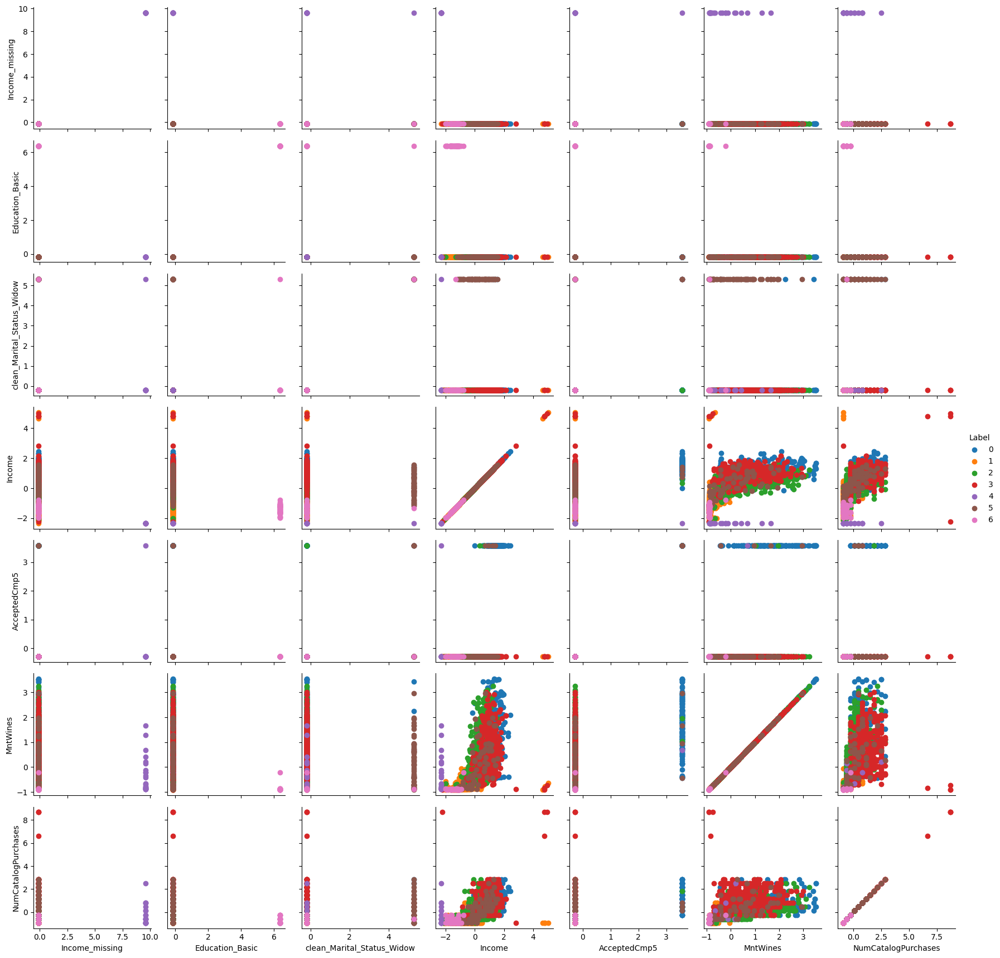

In [82]:
g = sns.PairGrid(
    data_with_clusters_clean_std_k7,
    vars=['Income_missing', 'Education_Basic', 'clean_Marital_Status_Widow', 'Income', 'AcceptedCmp5', 'MntWines','NumCatalogPurchases'],
    hue='Label')
g.map(plt.scatter)
g.add_legend();

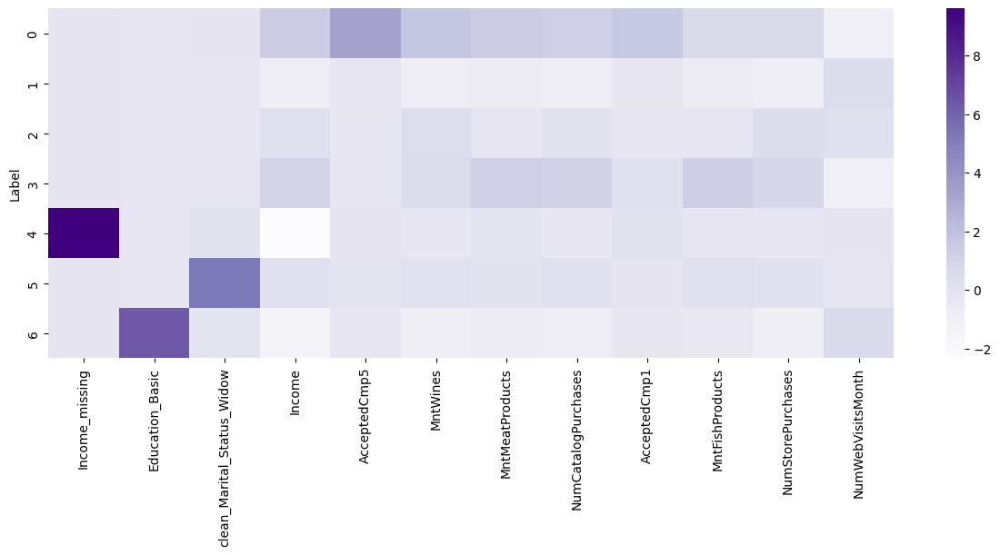

In [83]:
filter_col_names_clean_std_k7 = ['Income_missing', 'Education_Basic', 'clean_Marital_Status_Widow', 'Income', 'AcceptedCmp5', 'MntWines', 'MntMeatProducts', 'NumCatalogPurchases', 'AcceptedCmp1', 'MntFishProducts', 'NumStorePurchases', 'NumWebVisitsMonth']
plt.figure(figsize=(15,5))
sns.heatmap(data_with_clusters_clean_std_k7[filter_col_names_clean_std_k7].groupby(data_with_clusters_clean_std_k7['Label']).mean(), cmap="Purples")
plt.show()

Бачимо, що найбільш визначальною в даному відображенні є параметр відсутності значення Income (виокремлює окремий кластер). Також Basic Education утворює окремий кластер, як і Marital_Status_Widow

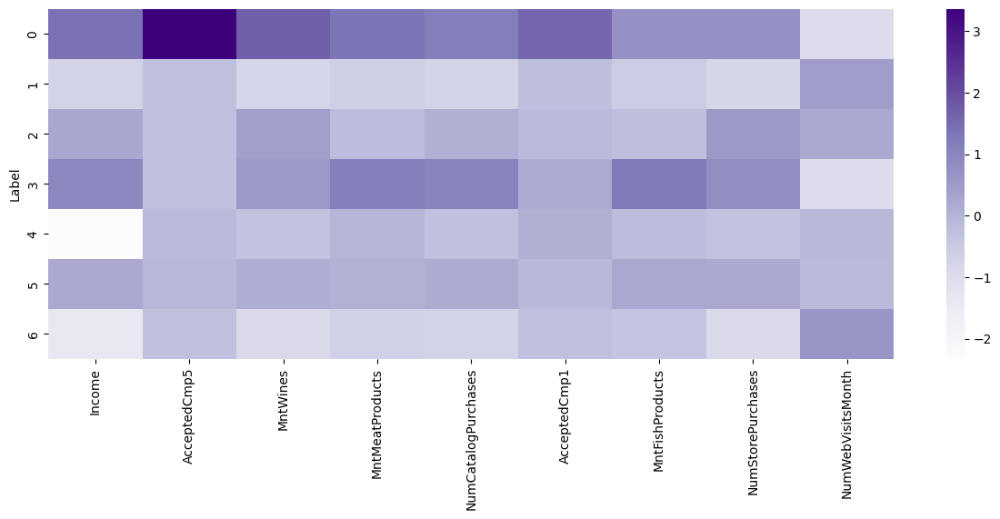

In [85]:
filter_col_names_clean_std_k7_2 = ['Income', 'AcceptedCmp5', 'MntWines', 'MntMeatProducts', 'NumCatalogPurchases', 'AcceptedCmp1', 'MntFishProducts', 'NumStorePurchases', 'NumWebVisitsMonth']
plt.figure(figsize=(15,5))
sns.heatmap(data_with_clusters_clean_std_k7[filter_col_names_clean_std_k7_2].groupby(data_with_clusters_clean_std_k7['Label']).mean(), cmap="Purples")
plt.show()

Бачимо, що наступні метрики мають різні середні значення для різних кластерів,тому потенційно можуть бути інтерпретовані

## Завдання 9

**Завдання 9.** Використовуючи методи `scipy` `dendrogram, linkage, fcluster`
1. Побудуйте ієрархічну агломеративну кластеризацію з `single linkage` на даних невідмасштабованих, але з прибраним викидом.
2. Візуалізуйте дендрограму. При візуалізації обовʼязково задайте параметр `truncate_mode='lastp'` - це обріже дендрограму, без цього вона буде завелика, бо у нас тут даних суттєво більше, ніж в лекції.
3. Проаналізуйте дендрограму та побудуйте варіанти плоских кластеризацій з `fcluster` на 2 і 3 кластери. Візуалізуйте результати кожної з цих кластеризацій та зробіть висновок. Чи вважаєте ви якусь з цих кластеризацій вдалою? Що спостерігаєте з цих кластеризацій?
4. Порахуйте мерику силуету для цього методу кластеризації.

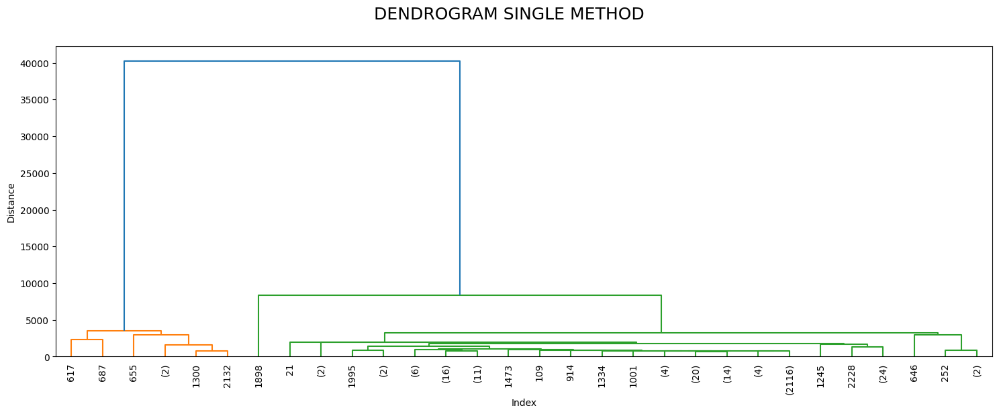

In [88]:
dist_sin_clean = linkage(data_no_outl, method="single")
plt.figure(figsize=(18,6))
dendrogram(dist_sin_clean, leaf_rotation=90, truncate_mode='lastp')
plt.xlabel('Index')
plt.ylabel('Distance')
plt.suptitle("DENDROGRAM SINGLE METHOD",fontsize=18)
plt.show()

З дендрограми видно, що виділяються два кластери.

Побудуємо варіанти плоских кластеризацій на 2 і 3 кластери

In [90]:
fcluster_data = data_no_outl.copy()
fcluster_data['2_clust'] = fcluster(dist_sin_clean, 2, criterion='maxclust')
fcluster_data['3_clust'] = fcluster(dist_sin_clean, 3, criterion='maxclust')

In [92]:
fcluster_data.head()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age,2_clust,3_clust
0,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,0,663,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,57,2,2
1,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,0,113,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,60,2,2
2,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,0,312,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,49,2,2
3,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,0,139,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,30,2,2
4,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,0,161,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,33,2,2


2 кластери

In [93]:
cluster_profile_fcluster2 = fcluster_data.groupby('2_clust').mean()
print('Fcluster=2 Data Mean Cluster Values')
display(cluster_profile_fcluster2)

feature_diff_fcluster2 = cluster_profile_fcluster2.max() - cluster_profile_fcluster2.min()
print('Fcluster=2 Data Mean Cluster Value Difference')
display(feature_diff_fcluster2.sort_values(ascending=False))

Fcluster=2 Data Mean Cluster Values


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age,3_clust
2_clust,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,158024.285714,0.285714,0.285714,52.285714,29.000000,3.142857,708.142857,3.714286,1.285714,2.571429,4.285714,0.142857,11.142857,0.428571,0.428571,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,0.000000,352.428571,0.000000,0.000000,0.285714,0.142857,0.571429,0.142857,0.000000,0.428571,0.000000,0.428571,0.000000,42.142857,1.000000
2,51055.552172,0.444693,0.506941,49.099418,304.797582,26.374832,165.253471,37.631438,27.143753,44.151814,2.318854,4.097179,2.635468,5.806986,5.331841,0.072996,0.074787,0.072996,0.064487,0.013435,0.009404,3.0,11.0,0.149575,0.010748,353.585759,0.090909,0.024183,0.503807,0.165249,0.215853,0.103448,0.001791,0.385580,0.216301,0.258397,0.034483,45.181370,2.000448


Fcluster=2 Data Mean Cluster Value Difference


,0
Income,106968.733542
MntMeatProducts,542.889386
MntWines,275.797582
MntGoldProds,41.580385
MntFishProducts,33.917152
MntSweetProducts,25.858039
MntFruits,23.231975
NumCatalogPurchases,8.507389
NumStorePurchases,5.378415
NumWebVisitsMonth,4.903269


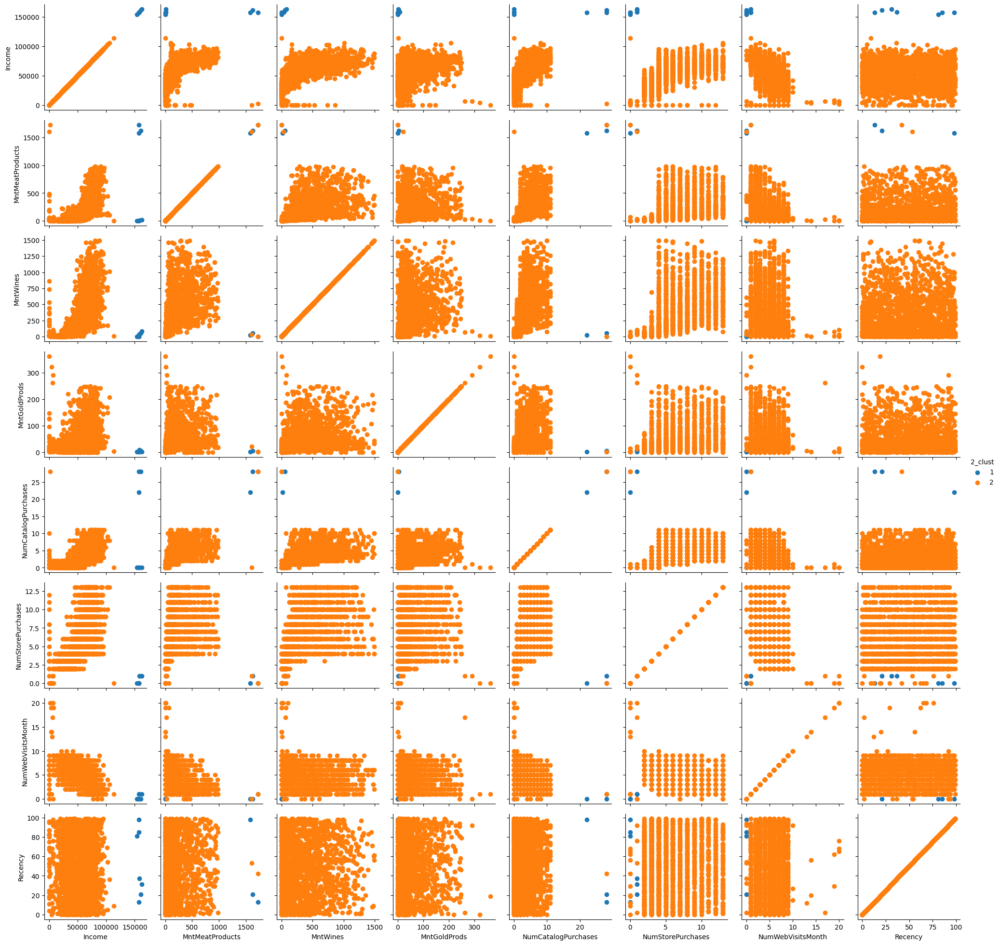

In [94]:
g = sns.PairGrid(
    fcluster_data,
    vars=['Income', 'MntMeatProducts', 'MntWines', 'MntGoldProds', 'NumCatalogPurchases', 'NumStorePurchases','NumWebVisitsMonth', 'Recency'],
    hue='2_clust')
g.map(plt.scatter)
g.add_legend();

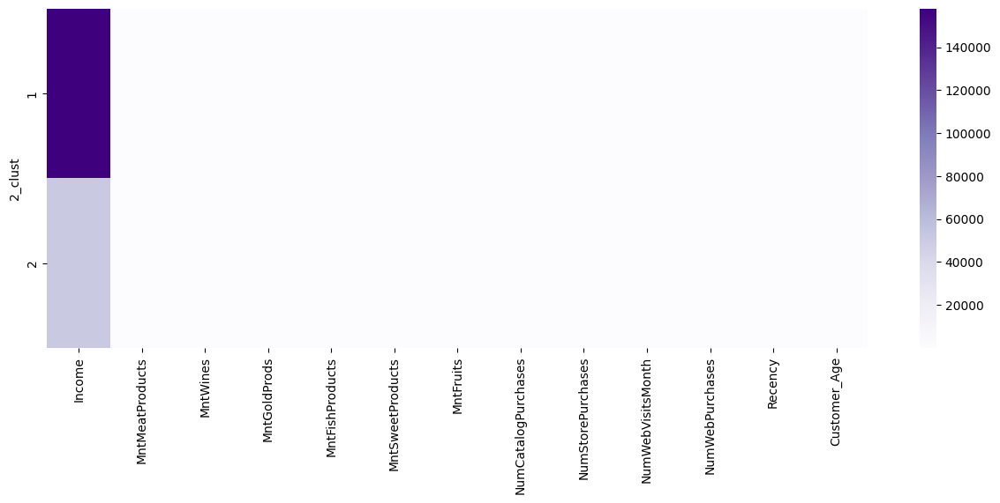

In [97]:
filter_col_names_fcluster2 = ['Income', 'MntMeatProducts', 'MntWines', 'MntGoldProds', 'MntFishProducts', 'MntSweetProducts', 'MntFruits', 'NumCatalogPurchases', 'NumStorePurchases','NumWebVisitsMonth', 'NumWebPurchases', 'Recency', 'Customer_Age']
plt.figure(figsize=(15,5))
sns.heatmap(fcluster_data[filter_col_names_fcluster2].groupby(fcluster_data['2_clust']).mean(), cmap="Purples")
plt.show()

Бачимо, що два виокремлені кластери розділяють клієнтів в основному за рівнем доходу

3 кластери

In [98]:
cluster_profile_fcluster3 = fcluster_data.groupby('3_clust').mean()
print('Fcluster=3 Data Mean Cluster Values')
display(cluster_profile_fcluster3)

feature_diff_fcluster3 = cluster_profile_fcluster3.max() - cluster_profile_fcluster3.min()
print('Fcluster=3 Data Mean Cluster Value Difference')
display(feature_diff_fcluster3.sort_values(ascending=False))

Fcluster=3 Data Mean Cluster Values


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age,2_clust
3_clust,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,158024.285714,0.285714,0.285714,52.285714,29.000000,3.142857,708.142857,3.714286,1.285714,2.571429,4.285714,0.142857,11.142857,0.428571,0.428571,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,0.000000,352.428571,0.00000,0.000000,0.285714,0.142857,0.571429,0.142857,0.000000,0.428571,0.00000,0.428571,0.000000,42.142857,1.0
2,51027.470430,0.444892,0.507168,49.117384,304.931452,26.385753,165.326165,37.647849,27.038530,44.170251,2.319892,4.086918,2.636649,5.809588,5.333781,0.073029,0.074821,0.073029,0.064516,0.013441,0.009409,3.0,11.0,0.149642,0.010753,353.729839,0.09095,0.024194,0.504032,0.165323,0.215502,0.103495,0.001792,0.385753,0.21595,0.258513,0.034498,45.170699,2.0
3,113734.000000,0.000000,0.000000,9.000000,6.000000,2.000000,3.000000,1.000000,262.000000,3.000000,0.000000,27.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,0.000000,32.000000,0.00000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.00000,0.000000,0.000000,69.000000,2.0


Fcluster=3 Data Mean Cluster Value Difference


,0
Income,106996.815284
MntMeatProducts,705.142857
lifetime_days,321.729839
MntWines,298.931452
MntSweetProducts,260.714286
Recency,43.285714
MntGoldProds,41.598822
MntFishProducts,36.647849
NumWebPurchases,26.857143
Customer_Age,26.857143


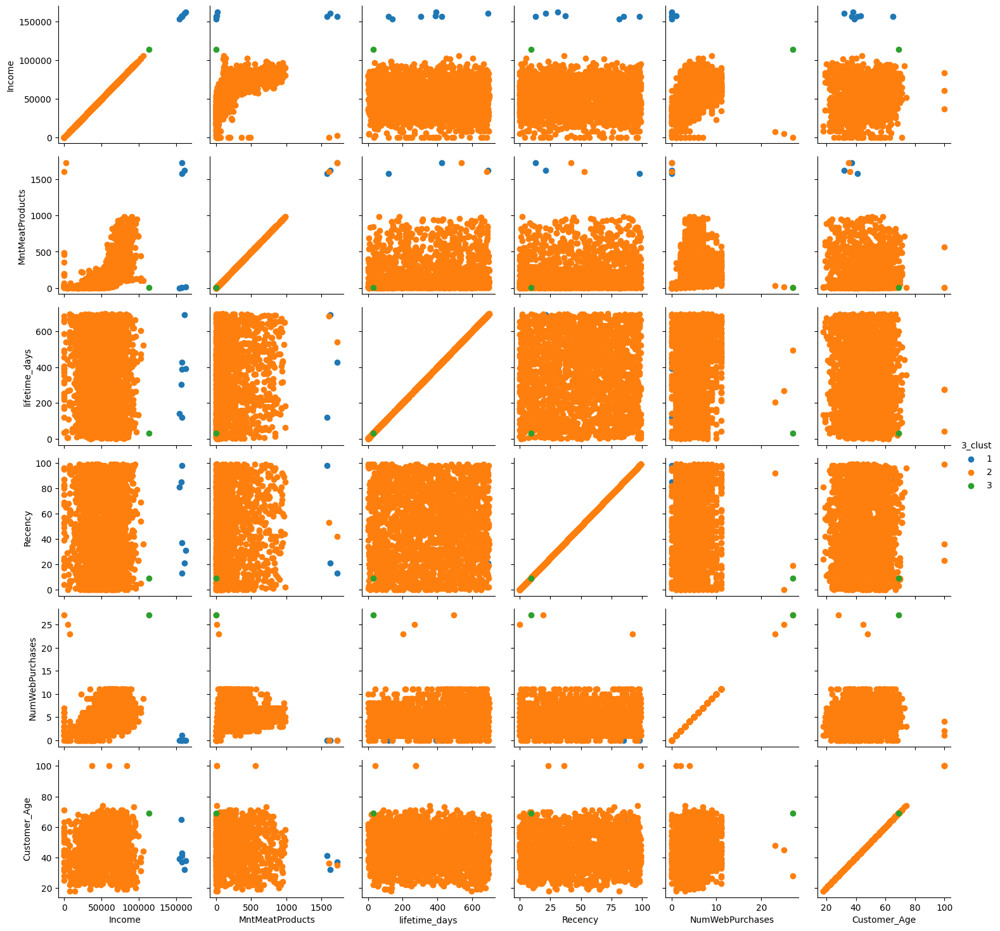

In [99]:
g = sns.PairGrid(
    fcluster_data,
    vars=['Income', 'MntMeatProducts', 'lifetime_days', 'Recency', 'NumWebPurchases', 'Customer_Age'],
    hue='3_clust')
g.map(plt.scatter)
g.add_legend();

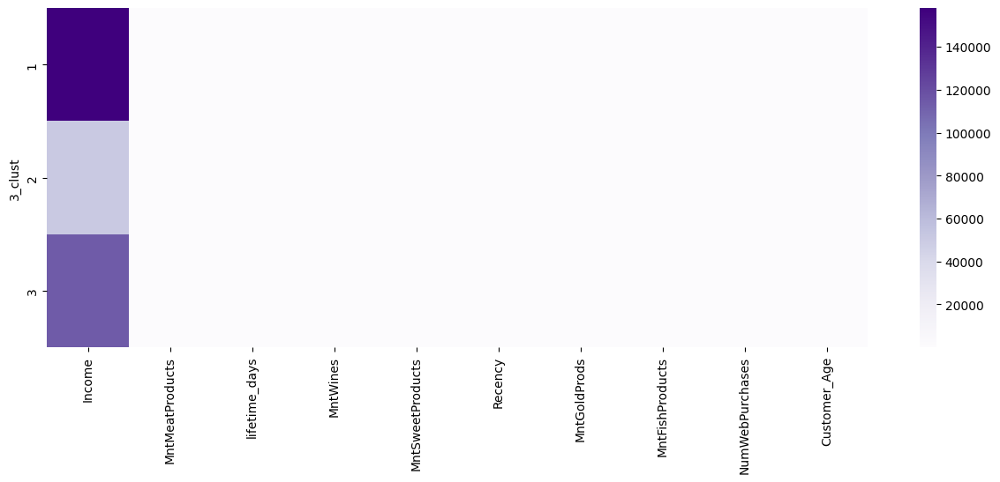

In [103]:
filter_col_names_fcluster3 = ['Income', 'MntMeatProducts', 'lifetime_days', 'MntWines', 'MntSweetProducts', 'Recency', 'MntGoldProds', 'MntFishProducts', 'NumWebPurchases', 'Customer_Age']
plt.figure(figsize=(15,5))
sns.heatmap(fcluster_data[filter_col_names_fcluster3].groupby(fcluster_data['3_clust']).mean(), cmap="Purples")
plt.show()

Бачимо, що знову кластеризація здійснюється в основному за рахунок значення Income, здійснююючи поділ на високий, середній та низький дохід.

Метрики силуету для 2 та 3 ієрархічних кластеризацій:

In [105]:
silhouette_avg_fcluster2 = silhouette_score(data_no_outl, fcluster_data['2_clust'])
silhouette_avg_fcluster3 = silhouette_score(data_no_outl, fcluster_data['3_clust'])
print(f'Fcluster=2 Data Clasterisation Score: {silhouette_avg_fcluster2.round(4)}')
print(f'\nFcluster=3 Data Clasterisation Score: {silhouette_avg_fcluster3.round(4)}')

Fcluster=2 Data Clasterisation Score: 0.7599

Fcluster=3 Data Clasterisation Score: 0.5492


Найвища метрика силуету отримана для Fcluster=2 (значення 0.7599)

Це найвище значення метрики силуету з усіх здійснених кластеризацій, проте також варто врахувати, що ця кластеризація здійснюється на основі значення Income

## Завдання 10

**Завдання 10.**
1. Використайте метод кластеризації, який ми не використовували в попередніх завданнях цього ДЗ (може бути ієрархічна кластеризація з іншим способом звʼязності або інші методи sklearn).
2. Порахуйте метрику силуету і візуалізуйте результат кластеризації. Зробіть висновок про те, чи могла б ця кластеризація бути корисною?

Виконаємо кластеризацію за допомогою методу DBSCAN

In [114]:
data_std_df

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
0,0.251939,-0.825218,-0.929894,0.307039,0.983781,1.551577,1.679702,2.462147,1.476500,0.843207,0.349414,1.409304,2.510890,-0.550785,0.693904,-0.28014,-0.283830,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,2.388846,-0.104069,1.531185,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,1.907271,-0.591099,-0.188676,0.997092
1,-0.208699,1.032559,0.906934,-0.383664,-0.870479,-0.636301,-0.713225,-0.650449,-0.631503,-0.729006,-0.168236,-1.110409,-0.568720,-1.166125,-0.130463,-0.28014,-0.283830,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-1.190545,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,1.907271,-0.591099,-0.188676,1.249987
2,0.778231,-0.825218,-0.929894,-0.798086,0.362723,0.570804,-0.177032,1.345274,-0.146905,-0.038766,-0.685887,1.409304,-0.226541,1.295237,-0.542647,-0.28014,-0.283830,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-0.205773,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,-0.524309,1.691765,-0.188676,0.322705
3,-0.978042,1.032559,-0.929894,-0.798086,-0.870479,-0.560857,-0.651187,-0.503974,-0.583043,-0.748179,-0.168236,-0.750450,-0.910898,-0.550785,0.281720,-0.28014,-0.283830,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-1.061881,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,-0.792406,-0.524309,1.691765,-0.188676,-1.278965
4,0.257993,1.032559,-0.929894,1.550305,-0.389085,0.419916,-0.216914,0.155164,-0.001525,-0.556446,1.384715,0.329427,0.115638,0.064556,-0.130463,-0.28014,-0.283830,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-0.953012,-0.315684,-0.157171,-1.006270,-0.444816,1.899751,-0.339909,-0.042295,1.261980,-0.524309,-0.591099,-0.188676,-1.026070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0.372429,-0.825218,0.906934,-0.107383,1.203678,0.419916,0.066692,0.081926,2.203398,3.891766,-0.168236,1.769263,0.115638,-0.550785,-0.130463,-0.28014,-0.283830,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,0.135680,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,-0.339909,-0.042295,1.261980,-0.524309,-0.591099,-0.188676,0.154108
2236,0.481437,2.890335,0.906934,0.237969,0.303291,-0.661449,-0.606873,-0.687068,-0.655733,-0.690659,2.420015,1.409304,-0.226541,-0.243114,0.693904,-0.28014,-0.283830,-0.28014,3.815174,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-1.655713,-0.315684,-0.157171,-1.006270,-0.444816,1.899751,-0.339909,-0.042295,-0.792406,-0.524309,1.691765,-0.188676,1.924374
2237,0.206750,-0.825218,-0.929894,1.446700,1.795020,0.545656,0.221789,-0.101168,-0.364974,-0.383886,-0.685887,-0.750450,0.115638,2.218248,0.281720,-0.28014,3.523233,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-0.982703,-0.315684,-0.157171,0.993769,-0.444816,-0.526385,2.941967,-0.042295,-0.792406,-0.524309,-0.591099,-0.188676,-1.026070
2238,0.685744,-0.825218,0.906934,-1.419719,0.368666,0.092992,0.208495,0.777683,0.071165,0.325527,-0.168236,0.689386,0.799996,1.295237,-0.954831,-0.28014,-0.283830,-0.28014,-0.262111,-0.11651,-0.097282,0.0,0.0,-0.418612,-0.104069,-0.977755,-0.315684,-0.157171,-1.006270,2.248122,-0.526385,-0.339909,-0.042295,-0.792406,-0.524309,1.691765,-0.188676,1.081390


Пошук оптимального значення eps здійснимо методом ліктя, враховуючи, що кластер повинен містити мінімум 15 екземплярів (оберемо таке число, оскільки необхідно, щоб кластери взагалі могли сформуватися - формула кількість ознак * 2 дає значення 76, що є завеликим для того, щоб сформувати можливі дрібніші кластери).

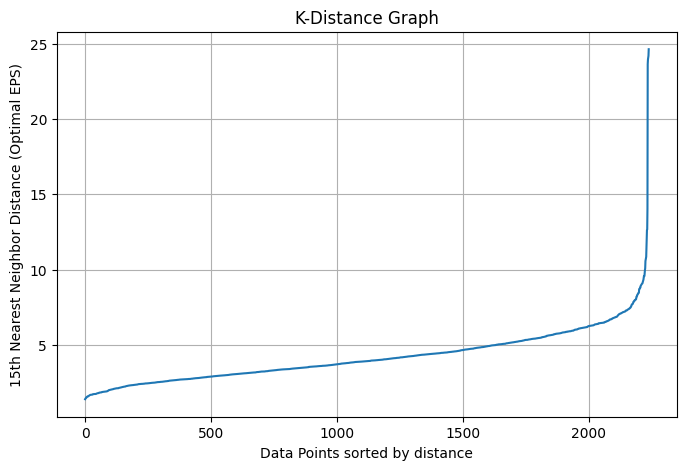

In [140]:
from sklearn.neighbors import NearestNeighbors

# 1. Calculate distances to the k-nearest neighbor (k = min_samples)
k = 15
neighbors = NearestNeighbors(n_neighbors=k)
neighbors_fit = neighbors.fit(data_std_df)
distances, indices = neighbors_fit.kneighbors(data_std_df)

# 2. Sort the distances to the 15th nearest neighbor
sort_distances = np.sort(distances[:, k-1], axis=0)

# 3. Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(sort_distances)
plt.title("K-Distance Graph")
plt.xlabel("Data Points sorted by distance")
plt.ylabel(f"{k}th Nearest Neighbor Distance (Optimal EPS)")
plt.grid(True)
plt.show()

Оптимальне значення eps=7

In [158]:
dbscan = DBSCAN(eps=7, min_samples=15)
dbscan.fit(data_std_df)
labels = dbscan.labels_
print(labels)

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

s = metrics.silhouette_score(data_std_df, dbscan.labels_)
print(f'Silhouette Coefficient for the data Dataset Clusters: {s:.2f}')

[0 0 0 ... 0 0 0]
Estimated number of clusters: 3
Estimated number of noise points: 55
Silhouette Coefficient for the data Dataset Clusters: 0.37


Отримали 3 кластери та 55 точок викидів. Візуалізуємо кластери

In [142]:
dbscan_clusters = data_std_df.copy()
dbscan_clusters['Label'] = labels

cluster_profile_dbscan = dbscan_clusters.groupby('Label').mean()
print('DBSCAN Mean Cluster Values')
display(cluster_profile_dbscan)

feature_diff_dbscan = cluster_profile_dbscan.max() - cluster_profile_dbscan.min()
print('DBSCAN Mean Cluster Value Difference')
display(feature_diff_dbscan.sort_values(ascending=False))

DBSCAN Mean Cluster Values


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Income_missing,lifetime_days,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,clean_Marital_Status_Divorced,clean_Marital_Status_Else,clean_Marital_Status_Married,clean_Marital_Status_Single,clean_Marital_Status_Together,clean_Marital_Status_Widow,Customer_Age
Label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
-1,0.867083,-0.487440,-0.161766,-0.089801,0.920622,-0.069328,0.888425,0.109557,0.254871,0.656703,0.311767,0.643573,1.167060,0.176436,-0.190417,0.489816,1.515873,1.189776,1.146406,4.628638,0.468721,0.0,0.0,1.010639,0.778940,0.114536,0.127659,-0.157171,-0.024432,-0.248966,0.223512,0.077785,1.680285,-0.306824,0.050428,0.031501,0.110711,-0.012956
0,-0.001836,0.005073,0.000492,-0.001301,-0.015472,0.005067,-0.015841,0.001784,-0.000950,-0.010310,-0.009905,-0.011093,-0.023910,0.001246,0.001942,-0.007716,-0.033925,-0.025639,-0.024839,-0.116510,-0.097282,0.0,0.0,-0.019974,-0.104069,-0.004537,-0.004318,0.006732,-0.001595,0.006515,-0.003433,0.002335,-0.042295,0.008116,-0.004712,-0.002315,0.000415,-0.003539
1,-2.018792,0.543670,0.230208,0.321580,-0.502005,-0.363644,-0.466469,-0.339190,-0.334368,-0.247654,0.185945,-0.390491,-0.352607,-0.469819,0.194945,-0.280140,-0.283830,-0.280140,-0.262111,-0.116510,-0.097282,0.0,0.0,-0.418612,9.609024,-0.057315,0.050991,-0.157171,-0.164148,0.122119,0.112072,-0.339909,-0.042295,-0.143653,0.371536,0.129806,-0.188676,0.242843
2,-0.299343,0.310090,0.192612,0.090235,-0.436795,-0.008998,-0.331883,-0.189663,-0.312476,-0.514904,0.033072,-0.230509,-0.340600,-0.191836,0.144326,-0.280140,-0.283830,-0.280140,-0.262111,-0.116510,10.279429,0.0,0.0,-0.262642,-0.104069,0.251972,0.071362,-0.157171,0.438203,-0.145600,-0.391599,-0.157582,-0.042295,0.120654,0.016042,0.043030,-0.188676,0.205624


DBSCAN Mean Cluster Value Difference


,0
Complain,10.376711
Income_missing,9.713092
AcceptedCmp2,4.745149
Income,2.885875
AcceptedCmp4,1.799703
clean_Marital_Status_Else,1.722580
NumCatalogPurchases,1.519667
AcceptedCmp5,1.469916
Response,1.429252
MntWines,1.422626


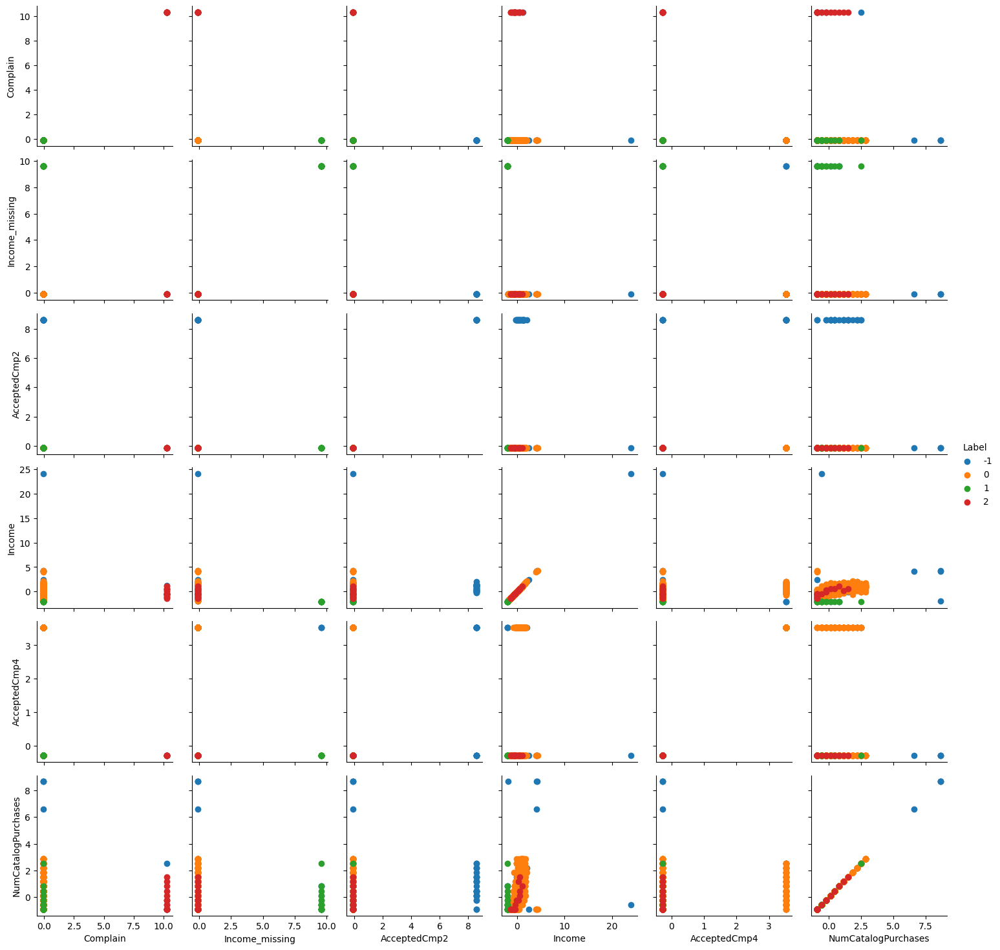

In [143]:
g = sns.PairGrid(
    dbscan_clusters,
    vars=['Complain', 'Income_missing', 'AcceptedCmp2', 'Income', 'AcceptedCmp4', 'NumCatalogPurchases'],
    hue='Label')
g.map(plt.scatter)
g.add_legend();

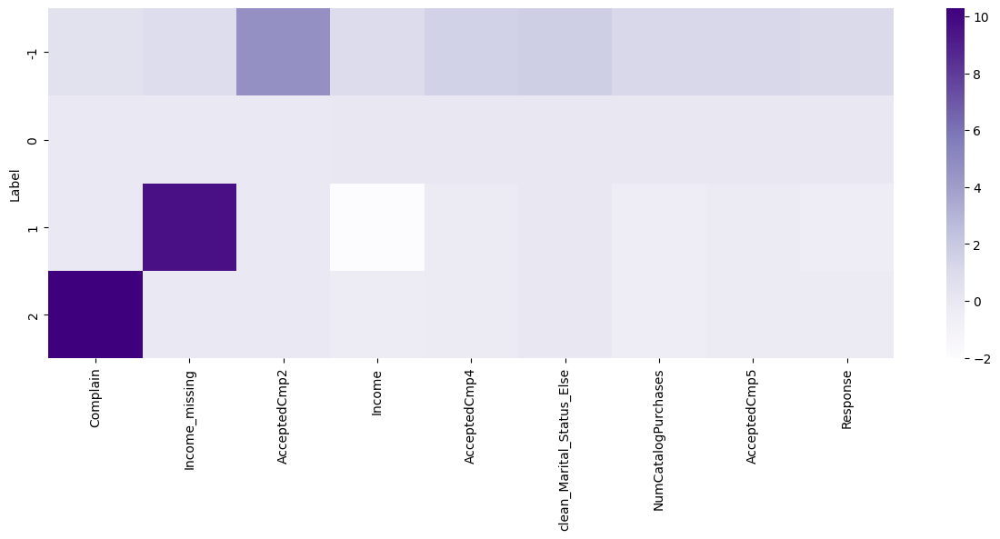

In [144]:
filter_col_names_dbscan = ['Complain', 'Income_missing', 'AcceptedCmp2', 'Income', 'AcceptedCmp4', 'clean_Marital_Status_Else', 'NumCatalogPurchases', 'AcceptedCmp5', 'Response']
plt.figure(figsize=(15,5))
sns.heatmap(dbscan_clusters[filter_col_names_dbscan].groupby(dbscan_clusters['Label']).mean(), cmap="Purples")
plt.show()

Бачимо, що кластери з Label 2 та 1 відповідно формуються за рахунок наявності скарг за останні 2 роки та за відсутністю інформації щодо доходу

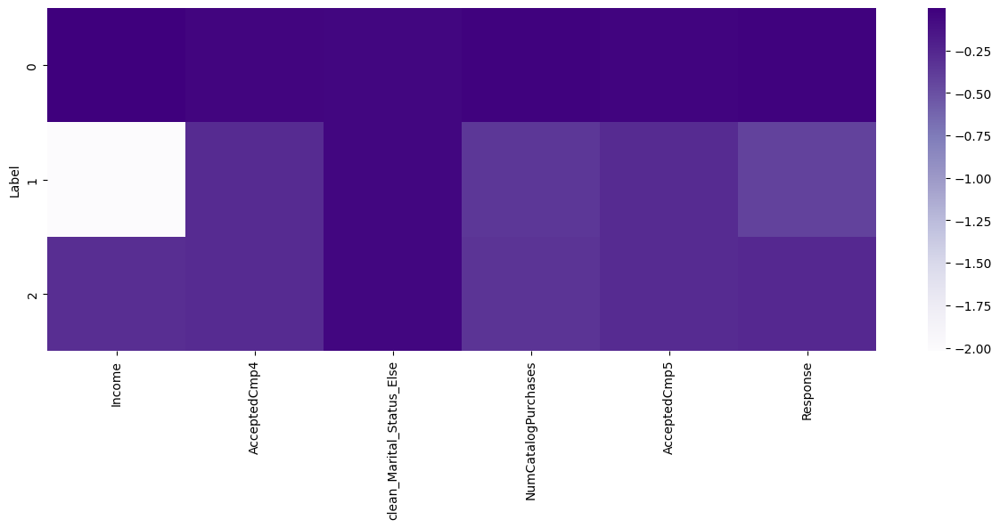

In [149]:
filter_col_names_dbscan = ['Income', 'AcceptedCmp4', 'clean_Marital_Status_Else', 'NumCatalogPurchases', 'AcceptedCmp5', 'Response']
plt.figure(figsize=(15,5))
sns.heatmap(dbscan_clusters.loc[dbscan_clusters['Label'] != -1, filter_col_names_dbscan].groupby(dbscan_clusters['Label']).mean(), cmap="Purples")
plt.show()

За іншими ознаками кластери розташовані більш-менш однаково.

Таким чином, отримано наступні кластери (окрім викидів):
- клієнти, які подавали скарги, з вказаним доходом
- клієнти, які не вказали дохід, не подавали скарги
- клієнти без скарг та із вказаним доходом

Для даних, масштабованих зі StandardScaler та масштабованих загалом, дана модель має найвище значення метрики силуету (0.37)

# Висновки

На основі натренованих кластеризацій можна виокремити наступні моделі та способи визначення кластерів:

1. Для немасштабованих даних формування кластерів методом KMeans визначається рівнем Income клієнта. Таким чином можна сформувати розподіл на 3 кластери за значенням рівня доходу (високий-середній-низький). Причиною такого поділу є вплив масштабу значень Income порівняно зі значеннями інших параметрів.  
Відповідна модель KMeans будується на 3 кластери, з позначенням викину Income через -1, та має метрику силуету 0.5343

2. Для немасштабованих даних формування кластерів методом ієрархічної кластеризації (на даних без викиду Income) також визначається рівнем Income та має краще значення метрики силуету для двох кластерів (0.7599) - високий-низький дохід

3. Для масштабованих даних вищі метрики силуету при порівнянні між результатами для даних, масштабованих через MinMaxScaler та StandardScaler, має масштабування першим з методів, проте інтерпретація логіки розподілення кластерів більш можлива для даних, масштабованих за допомогою StandardScaler.  

  - З точки зору бізнес-логіки, найкраща кластеризація через KMeans для масштабованих даних отримується для даних без викиду в Income, побудованих для 3-х кластерів та з метрикою силуету 0.1059. Кластеризація враховує як рівень доходу так і показники витрат та активності клієнтів. Значення метрики збільшується для 7 кластерів, проте інтерпретація в такому випадку значно ускладнюється через велику кількість параметрів

  - За метрикою силуету найкраща кластеризація для машстабованих даних отримана з методу DBSCAN (0.37) з гіперпараметрами (eps = 7, min_samples=15). У даній кластеризації клієнти розділені на групи: клієнти зі скаргами, клієнти без вказаного доходу, клієнти без скарг та із вказаним доходом). Окрім цього, метод виявив 55 викидів

Таким чином, залежно від вибору напрямку, в якому повинна бути використана кластеризація, можна вибрати один із підходів до кластеризації:
- За рівнем доходу та активністю клієнтів - кластеризація методом KMeans при масштабуванні даних методом StandardScaler (проте в даному випадку кластери знаходяться близько один до одного та мають нечітке розрізнення):
  - **Кластер 1** - найменше витрат, найменший дохід, найбільша кількість відвідувань на сайті, середня кількість покупок за знижками.
  Умовно: кластер з онлайн-клієнтами, які взаємодіють з магазином здебільшого через сайт, проте майже не здійснюють покупок, при покупках в середньому користуються знижками.      
  - **Кластер 2** - середні суми витрат та середній дохід, найбільша кількість онлайн-покупок, середня кількість покупок у фізичному магазині, найбільша кількість покупок з використанням знижок. Умовно: кластер онлайн-клієнтів, які здійснюють покупки переважно на сайті, менше - у фізичному магазині, та надають перевагу знижкам.
  - **Кластер 3** - найбільші суми витрат та доходу, середня кількість онлайн покупок та найбільша кількість покупок в магазині та за каталогом, найменшою кількістю відвідувань сайту та найменшою кількістю покупок за знижками. Умовно: кластер офлайн-клієнтів, які мають найбільші доходи та витрати, найбільше користуються каталогом та найменше користуються сайтом.

- За "проблемністю" та наявністю даних клієнтів:
  - **Кластер 1** - клієнти, які подавали скарги, але вказали дохід
  - **Кластер 2** - клієнти, які не вказали дохід, не подавали скарги
  - **Кластер 3** - клієнти без скарг та із вказаним доходом


У випадку необхідності визначення сегменту клієнтів, який найімовірніше придбає продукт, краще використати кластеризацію за рівнем доходу та активністю клієнтів, оскільки, як можна було побачити із теплових карт, клієнти з більшим доходом зазвичай мають тенденцію до більших витрат.

Для цього випадку отримано наступні візуалізації кластерів

Розподіл по кластерах для комбінацій найбільш впливових параметрів

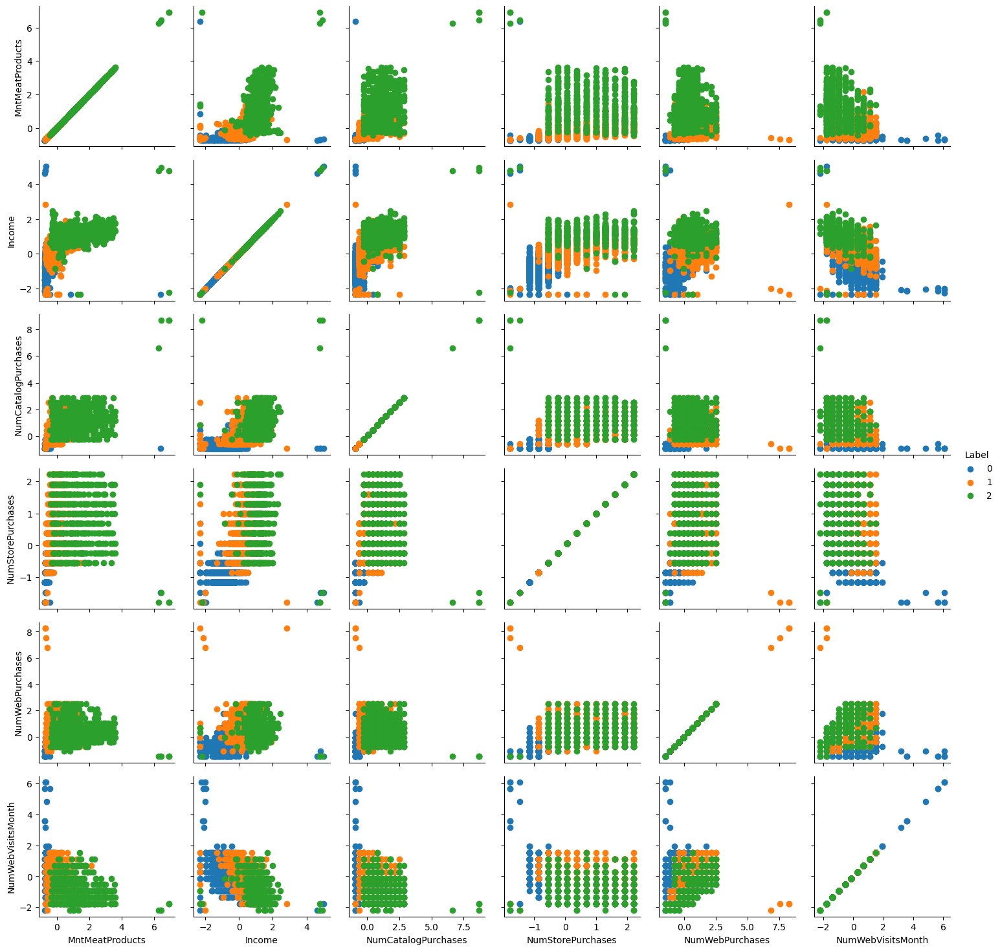

In [167]:
g = sns.PairGrid(
    data_with_clusters_clean_std,
    vars=['MntMeatProducts', 'Income', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebPurchases', 'NumWebVisitsMonth'],
    hue='Label')
g.map(plt.scatter)
g.add_legend();

Основні відмінності в кластерах за значеннями параметрів:

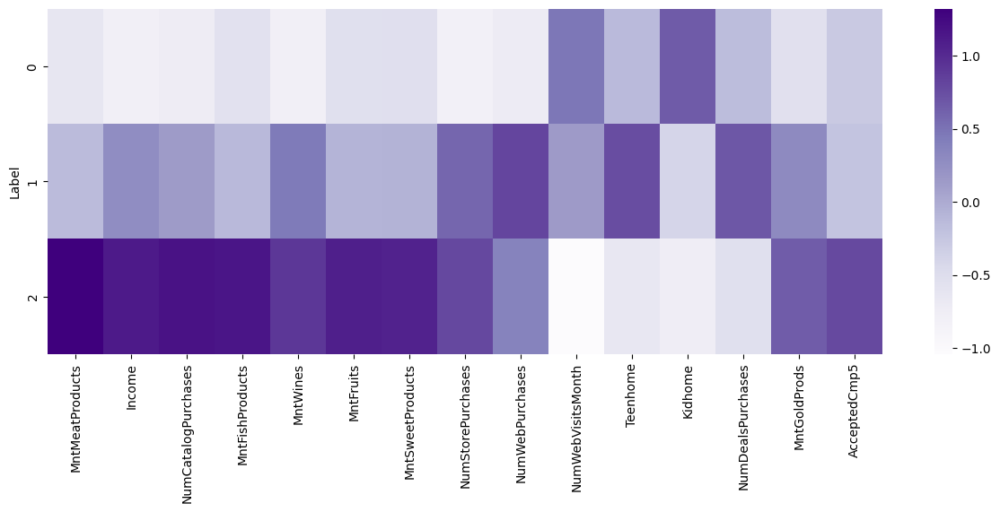

In [160]:
filter_col_names_clean_std = ['Income', 'NumStorePurchases', 'NumWebPurchases', 'NumWebVisitsMonth','Teenhome', 'Kidhome', 'NumDealsPurchases', 'MntGoldProds', 'AcceptedCmp5']
plt.figure(figsize=(15,5))
sns.heatmap(data_with_clusters_clean_std[filter_col_names_clean_std].groupby(data_with_clusters_clean_std['Label']).mean(), cmap="Purples")
plt.show()

Показ кластерів на немасштабованих даних

In [168]:
fig = px.scatter_3d(data_no_outl, 'Income', 'NumStorePurchases', 'NumWebPurchases', color = labels_std_clean)
fig.show()